In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import kagglehub
hasnainjaved_melanoma_skin_cancer_dataset_of_10000_images_path = kagglehub.dataset_download('hasnainjaved/melanoma-skin-cancer-dataset-of-10000-images')

print('Data source import complete.')


#  Melanoma Classification Using Vision Transformers
## Abstract
This project aims to implement a novel approach for melanoma classification by leveraging the Fourier Vision Transformer (ViT) model. The methodology begins with the implementation of a traditional Convolutional Neural Network (CNN) to establish a baseline for performance. Subsequently, the project enhances the traditional ViT architecture by incorporating Fourier transform features, wavelet transform features and combining them aiming to improve classification accuracy. The results of all models are compared to evaluate the effectiveness of integrating transforms into the ViT framework for melanoma classification.


In [ ]:
import numpy as np
import pandas as pd
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))



/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9697.jpg
/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_10087.jpg
/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9618.jpg
/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9614.jpg
/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9862.jpg
/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9838.jpg
/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9851.jpg
/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9691.jpg
/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/

dataset

In [ ]:
## train data
train_data = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train'

## test data
test_data = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test'

In [ ]:
benign_data ='/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train/benign'
malignant_data ='/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train/malignant'

In [ ]:
import pandas as pd
import numpy as np
import os
import glob as gb
import matplotlib.pyplot as plt
import cv2

## Dataset

The dataset used for this project consists of **10,000 images** of skin lesions, specifically designed for melanoma classification. The dataset is divided into two main categories: **benign** and **malignant** lesions.

### Dataset Structure
- **Training Set**: 9,600 images
  - **Benign**: 4,800 images
  - **Malignant**: 4,800 images
- **Validation Set**: 1,000 images
  - **Benign**: 500 images
  - **Malignant**: 500 images


In [ ]:
train_images = []
train_labels = []
class_ = {'benign': 0, 'malignant': 1}


for folder in os.listdir(train_data):
    folder_path = os.path.join(train_data, folder)

    if os.path.isdir(folder_path):
        print(f"Processing folder: {folder}")

        data = gb.glob(os.path.join(folder_path, '*.jpg'))
        print(f"Found {len(data)} images in folder {folder}")

        image_count = 0  # counter for processed images in this folder
              # read train images
        for img_path in data:
            image = cv2.imread(img_path)
            if image is not None:
                image_resized = cv2.resize(image, (100, 100))
                train_images.append(image_resized)
                train_labels.append(class_[folder])
                image_count += 1
            else:
                print(f"Warning: Could not read image {img_path}")

        print(f"Processed {image_count} images from folder {folder}")
    else:
        print(f"Skipping non-folder item: {folder}")
# Final output
print(f"Total images processed: {len(train_images)}")
print(f"Total labels assigned: {len(train_labels)}")

Processing folder: benign
Found 5000 images in folder benign
Processed 5000 images from folder benign
Processing folder: malignant
Found 4605 images in folder malignant
Processed 4605 images from folder malignant
Total images processed: 9605
Total labels assigned: 9605


In [ ]:
import os
import glob as gb
import cv2
test_images = []
test_labels = []
class_ = {'benign': 0, 'malignant': 1}
for folder in os.listdir(test_data):
    folder_path = os.path.join(test_data, folder)

    if os.path.isdir(folder_path):
        print(f"Processing folder: {folder}")

        data = gb.glob(os.path.join(folder_path, '*.jpg'))
        print(f"Found {len(data)} images in folder {folder}")

        image_count = 0  # counter for processed images in this folder
              # read test images
        for img_path in data:
            image = cv2.imread(img_path)
            if image is not None:
                image_resized = cv2.resize(image, (100, 100))
                test_images.append(image_resized)
                test_labels.append(class_[folder])
                image_count += 1
            else:
                print(f"Warning: Could not read image {img_path}")

        print(f"Processed {image_count} images from folder {folder}")
    else:
        print(f"Skipping non-folder item: {folder}")
# Final output
print(f"Total images processed: {len(test_images)}")
print(f"Total labels assigned: {len(test_labels)}")


Processing folder: benign
Found 500 images in folder benign
Processed 500 images from folder benign
Processing folder: malignant
Found 500 images in folder malignant
Processed 500 images from folder malignant
Total images processed: 1000
Total labels assigned: 1000


# Connecting to gpu/tpu

In [ ]:
import tensorflow as tf
try:
    resolver = tf.distribute.cluster_resolver.TPUClusterResolver()
    tf.config.experimental_connect_to_cluster(resolver)
    tf.tpu.experimental.initialize_tpu_system(resolver)
    print("TPU is available and connected.")
except ValueError:
    print("TPU is not available.")


TPU is not available.


In [ ]:
devices = tf.config.list_logical_devices()
for device in devices:
    print(device)


LogicalDevice(name='/device:CPU:0', device_type='CPU')
LogicalDevice(name='/device:GPU:0', device_type='GPU')


In [ ]:
import torch
if torch.cuda.is_available():
    device = torch.device("cuda")
    print("GPU is available, using:", torch.cuda.get_device_name(0))
else:
    device = torch.device("cpu")
    print("GPU not available, using CPU.")


GPU is available, using: Tesla P100-PCIE-16GB


In [ ]:
!nvidia-smi


/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


Fri Nov  1 20:35:05 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.90.07              Driver Version: 550.90.07      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   50C    P0             35W /  250W |    6067MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
with tf.device('/GPU:0'):
    # Build and compile your model here
    model = ...


## Data Augmentation

Data augmentation is a crucial technique in deep learning that enhances the diversity of the training dataset by applying various transformations to the original images. This helps improve the robustness of the model and reduces overfitting by creating new, slightly altered versions of the training images.

In this project, we use the **ImageDataGenerator** class from TensorFlow's Keras API to perform data augmentation on the training images.

### Data Augmentation Techniques

The following transformations are applied to the images:

- **Normalization**: The pixel values are rescaled to a range of 0 to 1 by dividing by 255.
- **Rotation**: Random rotations of up to 20 degrees are applied to the images to simulate different orientations.
- **Zoom**: A random zoom of up to 15% is applied to the images to improve the model's ability to recognize objects at various scales.
- **Width Shift**: The images can be shifted horizontally by 20% to introduce slight variations in position.
- **Height Shift**: Similar to width shift, the images can be shifted vertically by 20%.
- **Shear**: A shear transformation (a type of distortion) is applied with a range of 15 degrees in a counter-clockwise direction.
- **Horizontal Flip**: Images are randomly flipped horizontally to create mirror images, allowing the model to learn from mirrored variations.
- **Fill Mode**: Missing pixels created by transformations are filled using the nearest pixel values.


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest"
)


train_generator = datagen.flow(
    np.array(train_images),
    np.array(train_labels),
    batch_size=32
)
print(f"Augmented {len(train_images)} images for training.")


Augmented 9605 images for training.


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_data,
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary'
)
test_generator = test_datagen.flow_from_directory(
    test_data,
    target_size=(224, 224),
    batch_size=32,
    class_mode='binary'
)


Found 9605 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,  # Randomly flip images
    fill_mode="nearest"  # Fill any missing pixels after rotation
)

train_generator = datagen.flow(
    np.array(train_images),
    np.array(train_labels),
    batch_size=32
)
print(f"Augmented {len(test_images)} images for training.")


Augmented 1000 images for training.


Augmented 9605 images for training.


Displaying Augmented Images: 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]


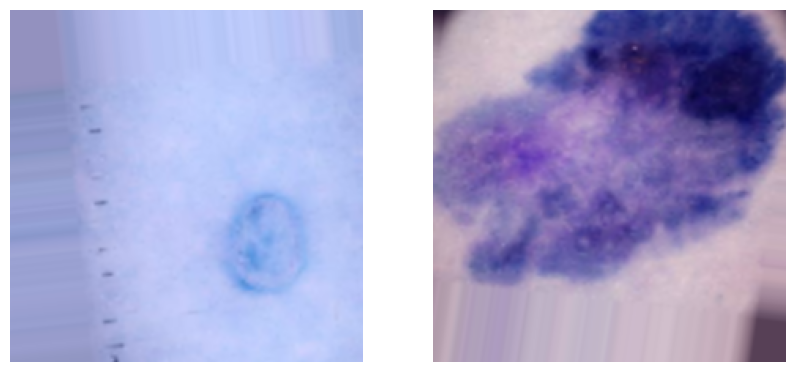

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tqdm import tqdm

def resize_images(images, target_size=(224, 224)):
    resized_images = []
    for img in images:
        resized_img = cv2.resize(img, target_size)
        resized_images.append(resized_img)
    return np.array(resized_images)
def display_augmented_images(generator, num_images=2):
    plt.figure(figsize=(10, 5))
    for i in tqdm(range(num_images), desc="Displaying Augmented Images"):
        img, _ = next(generator)
        plt.subplot(1, num_images, i + 1)
        plt.imshow(img[0])
        plt.axis('off')
    plt.show()
display_augmented_images(train_generator, num_images=2)


selecting random paths below

In [ ]:
import random
benign_paths = [
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9666.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9684.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9675.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9828.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_10008.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9654.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9767.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9897.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9706.jpg",
]

malignant_paths = [
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10221.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10267.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10303.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10529.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10528.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10554.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10136.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10389.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10130.jpg",
]

random_benign = random.sample(benign_paths, 3)
random_malignant = random.sample(malignant_paths, 3)

random_benign, random_malignant


(['/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9828.jpg',
  '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9666.jpg',
  '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9767.jpg'],
 ['/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10529.jpg',
  '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10267.jpg',
  '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10130.jpg'])

In the Fourier ViT paper, the Fourier transform is used to extract frequency-based features from the images, which are then combined with spatial features extracted by the Vision Transformer.



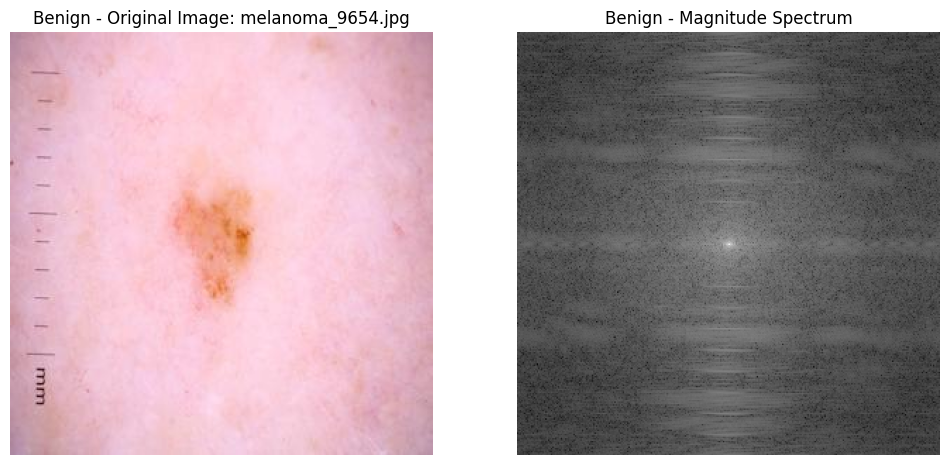

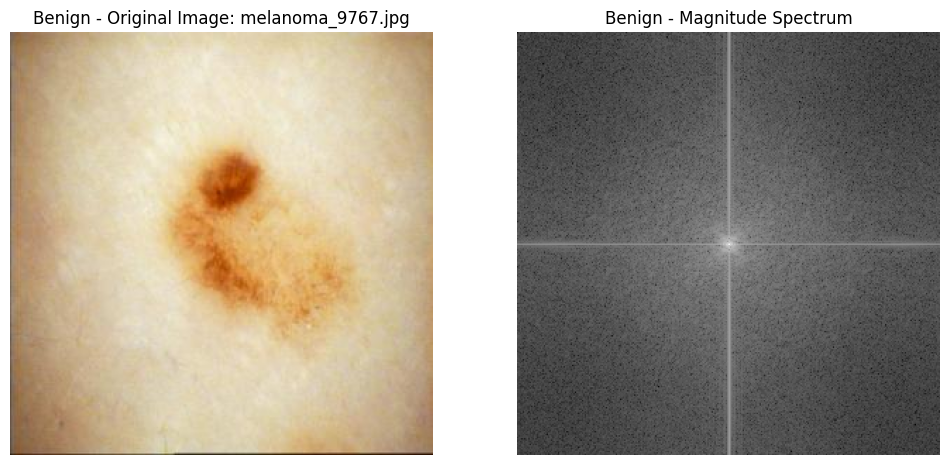

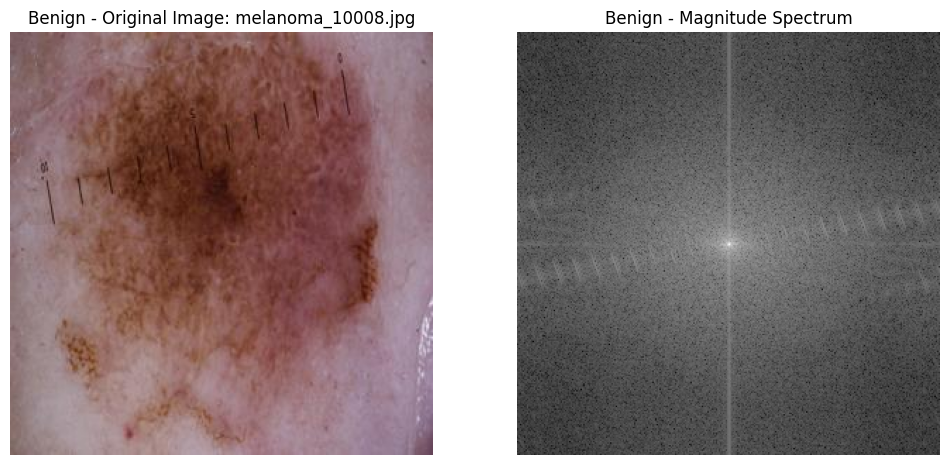

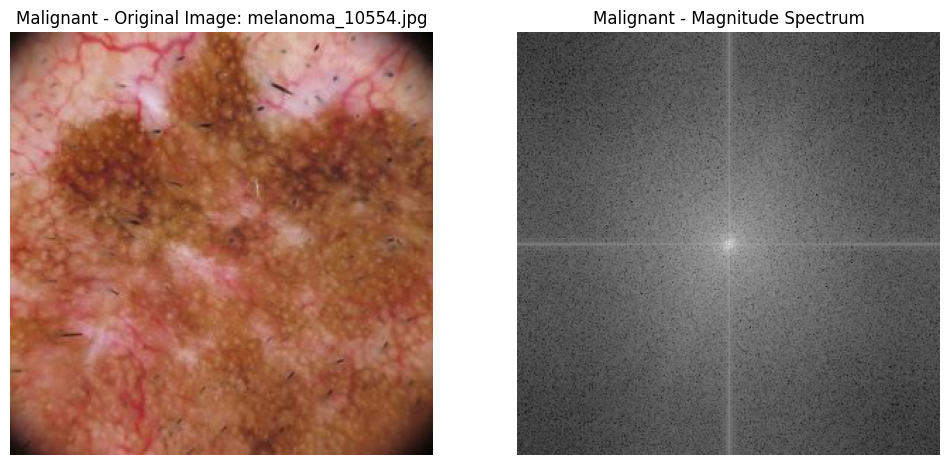

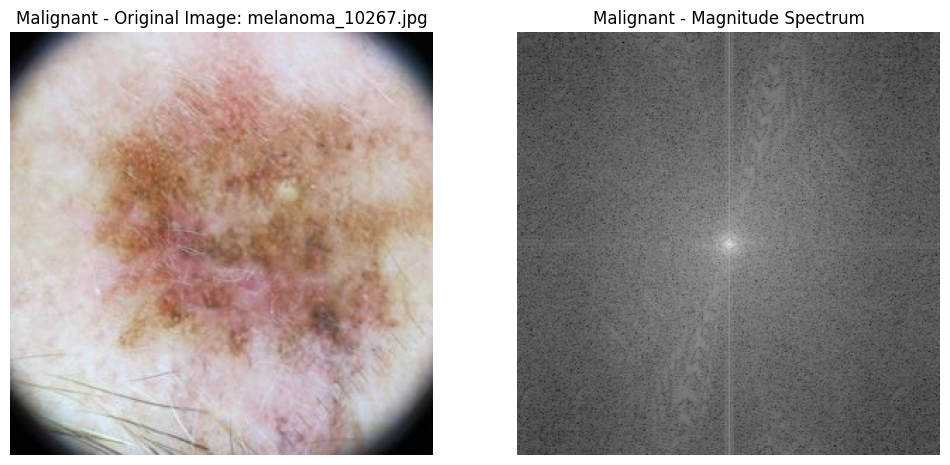

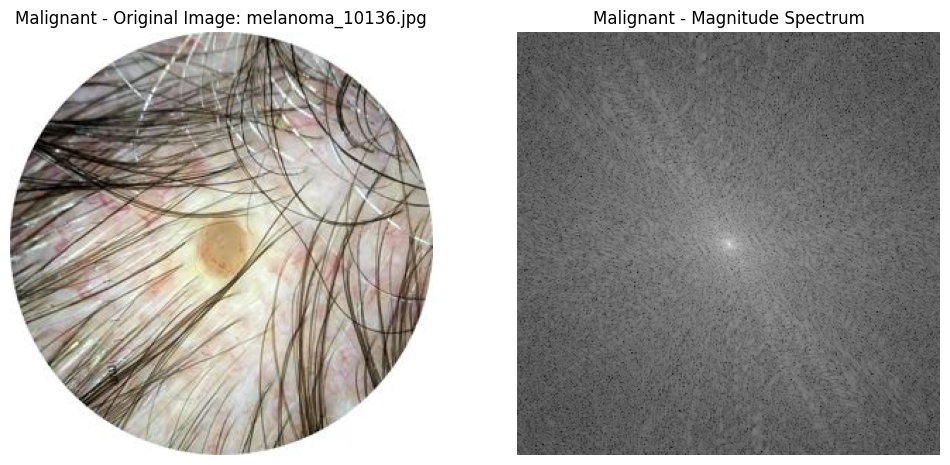

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt


def apply_fourier_transform(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    f = np.fft.fft2(gray)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1) #this once check
    return fshift, magnitude_spectrum

benign_paths = [
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9654.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9767.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_10008.jpg",
]

malignant_paths = [
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10554.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10267.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10136.jpg",
]


def process_and_display_images(image_paths, title_prefix):
    for path in image_paths:
        image = cv2.imread(path)
        transformed_image, mag_spectrum = apply_fourier_transform(image)
        plt.figure(figsize=(12, 6))
        plt.subplot(121)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(f'{title_prefix} - Original Image: {path.split("/")[-1]}')
        plt.axis('off')
        plt.subplot(122)
        plt.imshow(mag_spectrum, cmap='gray')
        plt.title(f'{title_prefix} - Magnitude Spectrum')
        plt.axis('off')
        plt.show()

process_and_display_images(benign_paths, 'Benign')
process_and_display_images(malignant_paths, 'Malignant')


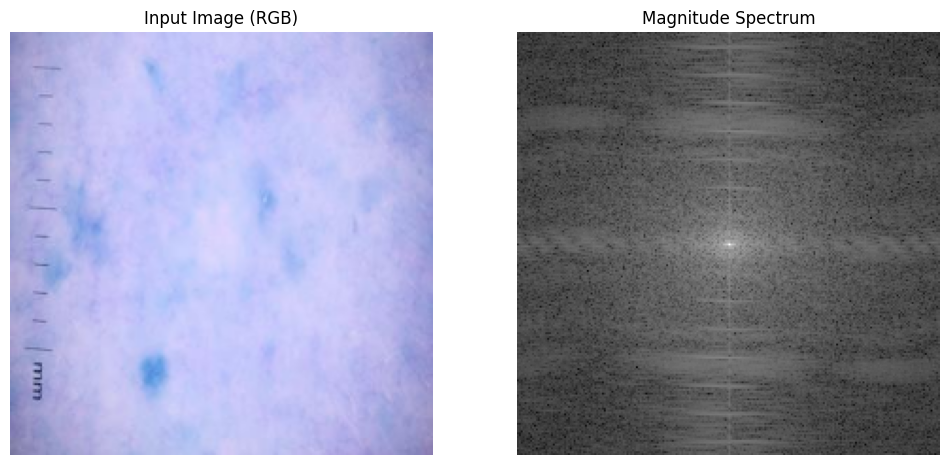

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2


def apply_fourier_transform(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    f = np.fft.fft2(gray)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)  # Add 1 to avoid log(0)

    return magnitude_spectrum

# Load and preprocess the specific image
image_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train/benign/melanoma_995.jpg'
image = tf.io.decode_jpeg(tf.io.read_file(image_path), channels=3)  # Load the image
image = tf.image.resize(image, [224, 224])  # Resize to match input size
image = tf.cast(image, tf.float32) / 255.0  # Convert to float32 and normalize
image_np = tf.squeeze(image).numpy() * 255  # Scale back to [0, 255]
image_np = image_np.astype(np.uint8)  # Convert to uint8 for OpenCV
magnitude_spectrum = apply_fourier_transform(image_np)

# Prepare for visualization
output_image_np = image_np  # Original grayscale image
magnitude_np = magnitude_spectrum  # Magnitude spectrum
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Display original image
ax[0].imshow(cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB))  # Original RGB image
ax[0].set_title('Input Image (RGB)')
ax[0].axis('off')
ax[1].imshow(magnitude_np, cmap='gray')  # Magnitude Spectrum
ax[1].set_title('Magnitude Spectrum')
ax[1].axis('off')

plt.show()


In [ ]:
pip install PyWavelets

Note: you may need to restart the kernel to use updated packages.


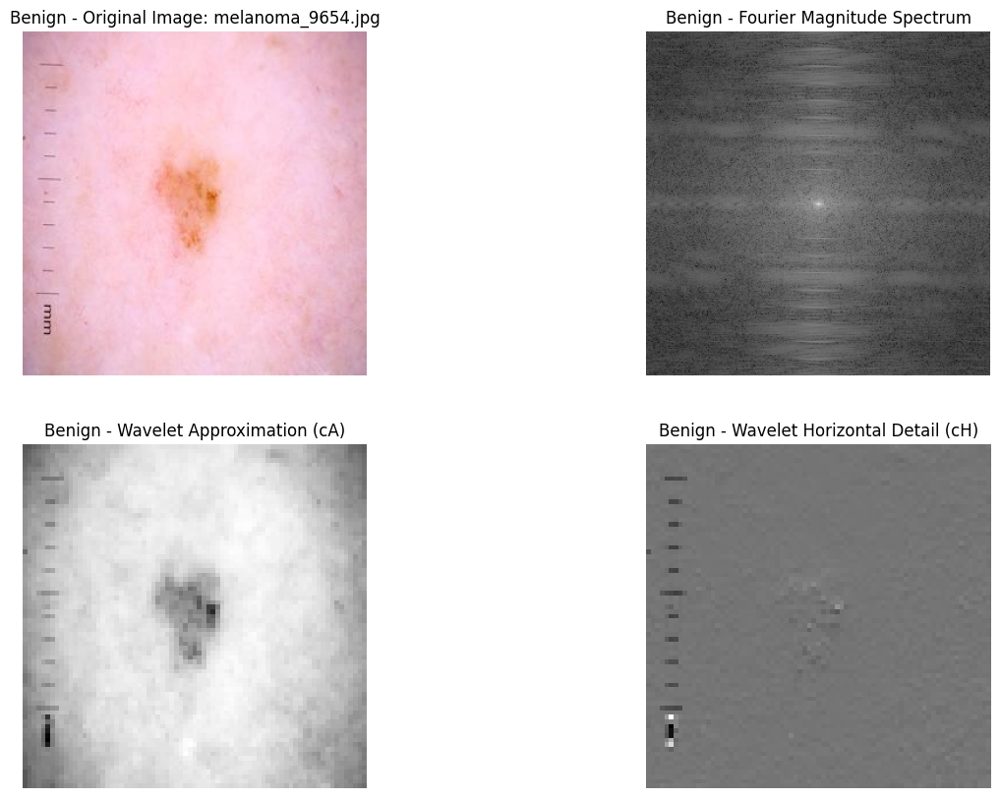

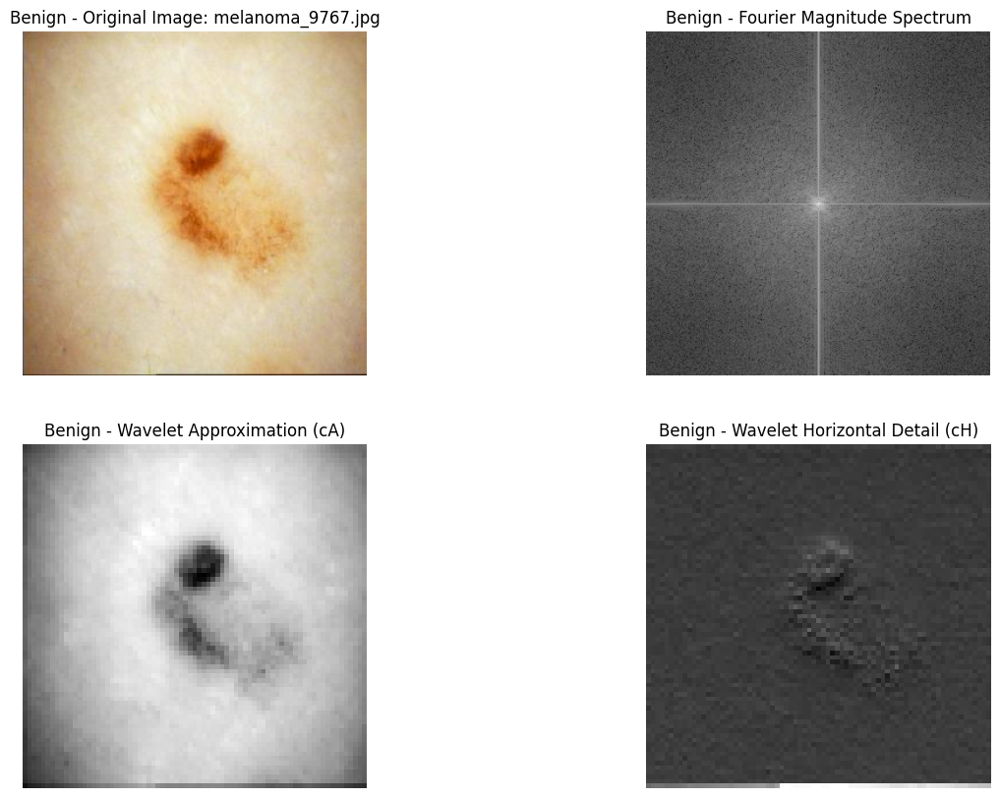

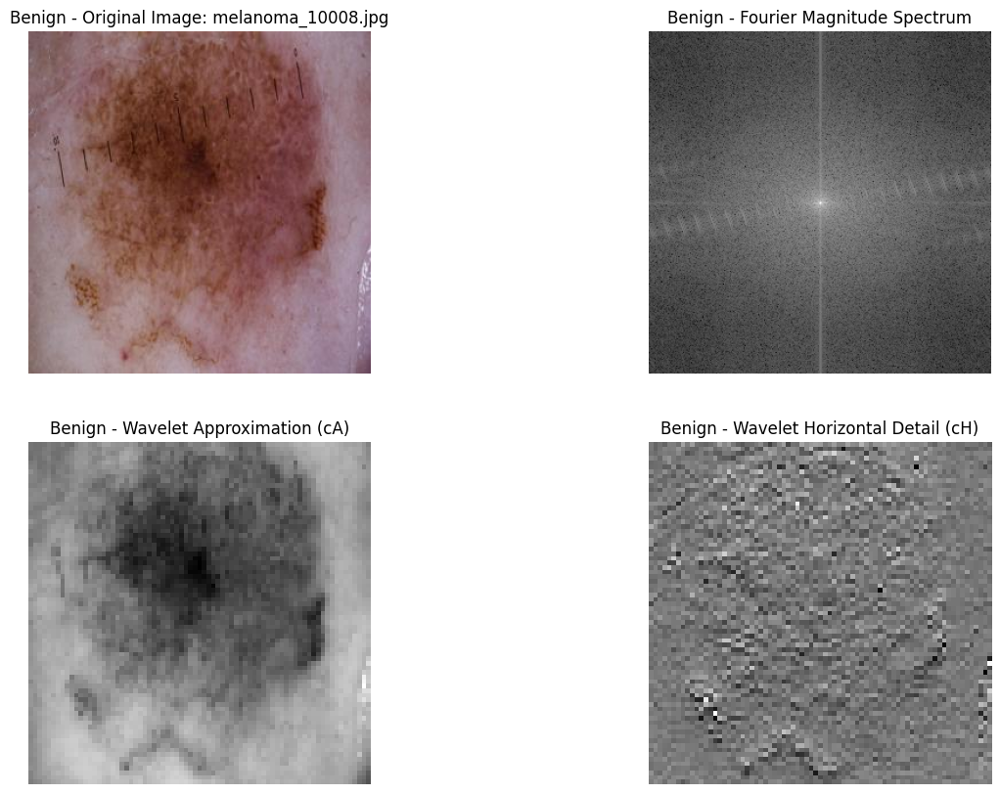

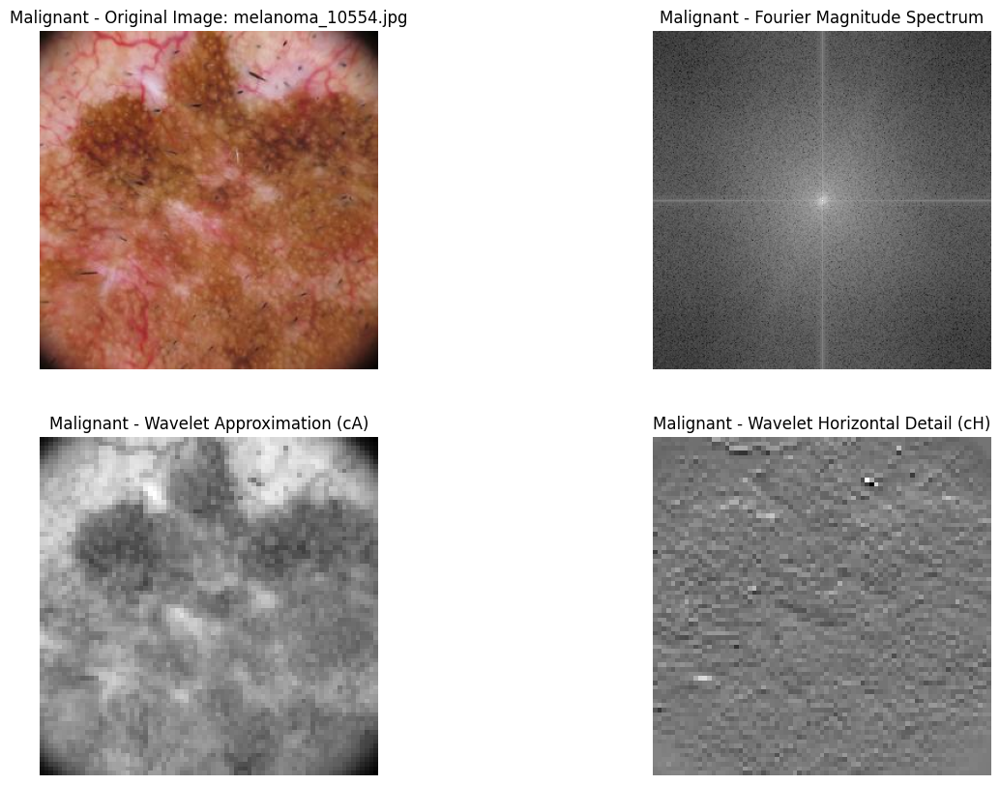

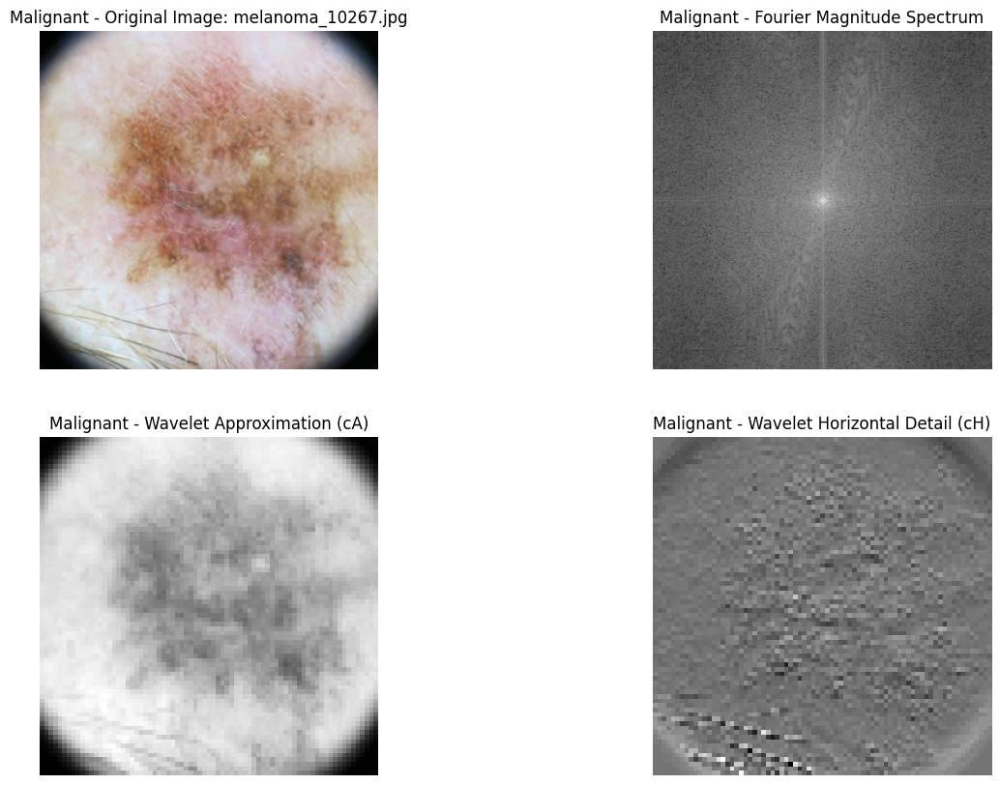

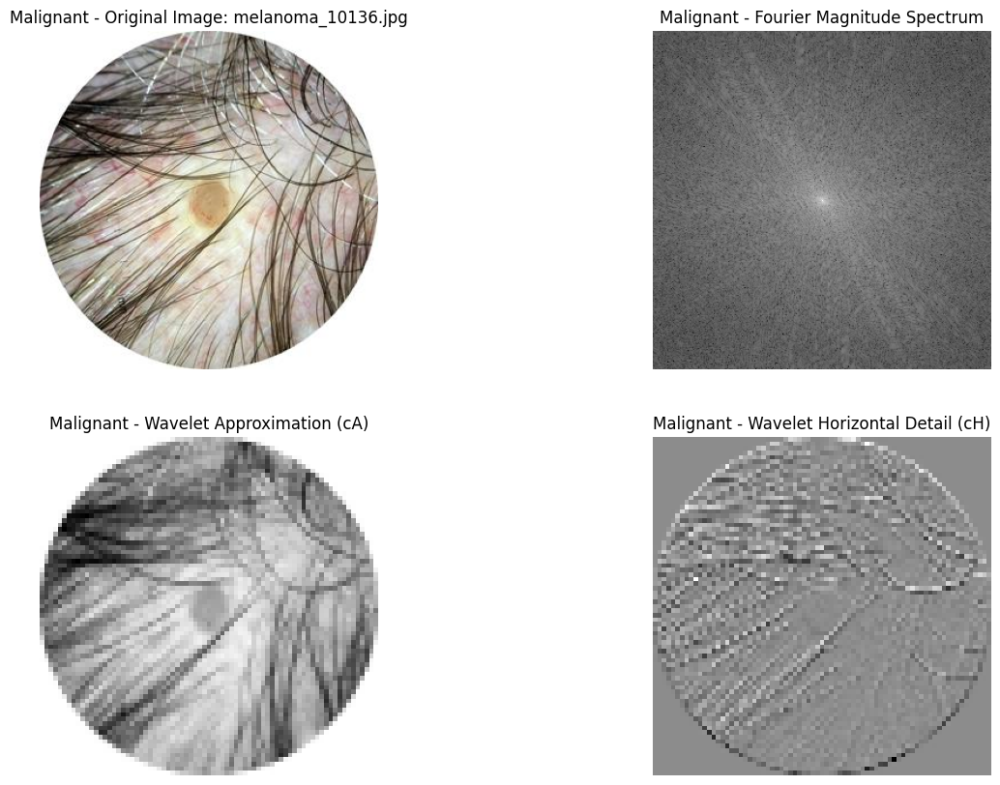

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pywt

def apply_fourier_transform(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    f = np.fft.fft2(gray)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)  # Add 1 to avoid log(0)
    return fshift, magnitude_spectrum

def apply_wavelet_transform(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    coeffs2 = pywt.wavedec2(gray, 'haar', level=2)

    # Extract coefficients
    cA = coeffs2[0]
    cH = coeffs2[1][0]
    cV = coeffs2[1][1]
    cD = coeffs2[1][2]

    return cA, cH, cV, cD

benign_paths = [
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9654.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_9767.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_10008.jpg",
]

malignant_paths = [
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10554.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10267.jpg",
    "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10136.jpg",
]

def process_and_display_images(image_paths, title_prefix):
    for path in image_paths:

        image = cv2.imread(path)

        # Apply Fourier Transform
        transformed_image, mag_spectrum = apply_fourier_transform(image)

        # Apply Wavelet Transform
        cA, cH, cV, cD = apply_wavelet_transform(image)

        plt.figure(figsize=(15, 10))


        plt.subplot(2, 2, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(f'{title_prefix} - Original Image: {path.split("/")[-1]}')
        plt.axis('off')

        plt.subplot(2, 2, 2)
        plt.imshow(mag_spectrum, cmap='gray')
        plt.title(f'{title_prefix} - Fourier Magnitude Spectrum')
        plt.axis('off')

        plt.subplot(2, 2, 3)
        plt.imshow(cA, cmap='gray')
        plt.title(f'{title_prefix} - Wavelet Approximation (cA)')
        plt.axis('off')

        plt.subplot(2, 2, 4)
        plt.imshow(cH, cmap='gray')
        plt.title(f'{title_prefix} - Wavelet Horizontal Detail (cH)')
        plt.axis('off')

        plt.show()

process_and_display_images(benign_paths, 'Benign')
process_and_display_images(malignant_paths, 'Malignant')


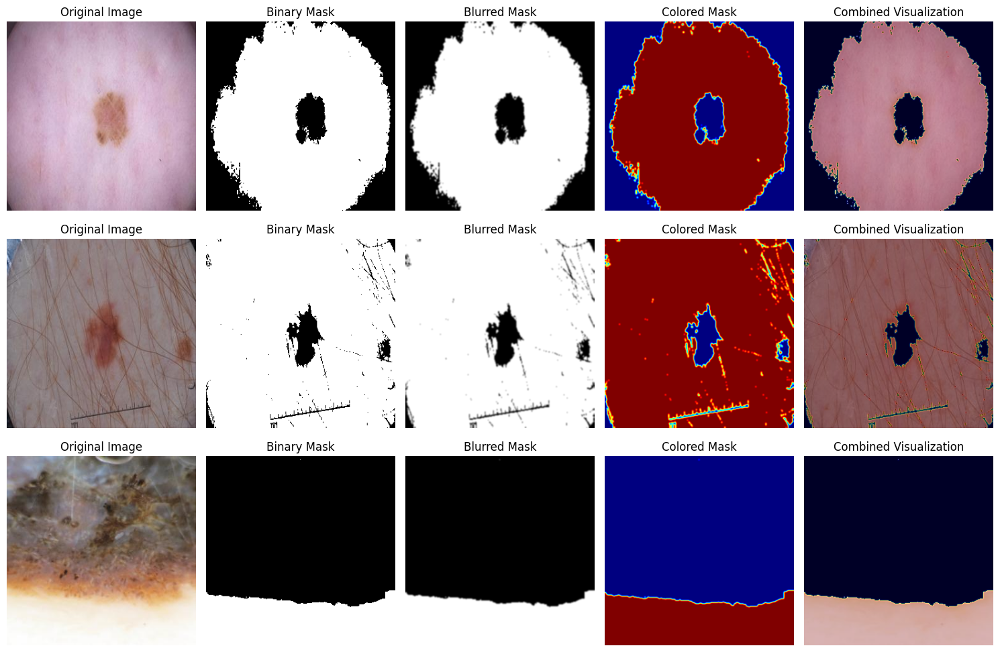

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

def improved_masking(image):
    if image is None:
        print("Error: Image not found.")
        return None, None, None, None, None

    # grmageayyy
    if image.shape[2] == 3:
        originalGray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        originalGray = image  # If it's already grayscale

    # Compute the histogram
    histogramValues = cv2.calcHist([originalGray], [0], None, [256], [0, 256])

    # Find the intensity with the highest number of pixels
    intensity = np.argmax(histogramValues)
    range_val = 35
    lowerThreshold = max(0, intensity - range_val)
    upperThreshold = min(255, intensity + range_val)

    # Create a binary mask using the intensity range
    mask = cv2.inRange(originalGray, np.array([lowerThreshold]), np.array([upperThreshold]))

    # Use the mask to preserve the original color information
    resultImage = image.copy()
    resultImage[np.where(mask == 0)] = 0

    # Optionally apply Gaussian blur to the mask for smoother edges
    mask_blurred = cv2.GaussianBlur(mask, (5, 5), 0)

    # Create a colored mask for visualization
    colored_mask = cv2.applyColorMap(mask_blurred, cv2.COLORMAP_JET)

    # Combine original image and colored mask
    combined = cv2.addWeighted(resultImage, 0.7, colored_mask, 0.3, 0)

    return resultImage, mask, mask_blurred, colored_mask, combined

def visualize_masks(image_paths):
    plt.figure(figsize=(15, 10))

    for idx, image_path in enumerate(image_paths):
        if not os.path.exists(image_path):
            print(f"Warning: {image_path} does not exist.")
            continue

        image = cv2.imread(image_path)
        resultImage, mask, mask_blurred, colored_mask, combined = improved_masking(image)

        if resultImage is None:
            continue

        plt.subplot(len(image_paths), 5, idx * 5 + 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title('Original Image')
        plt.axis('off')

        plt.subplot(len(image_paths), 5, idx * 5 + 2)
        plt.imshow(mask, cmap='gray')
        plt.title('Binary Mask')
        plt.axis('off')

        plt.subplot(len(image_paths), 5, idx * 5 + 3)
        plt.imshow(mask_blurred, cmap='gray')
        plt.title('Blurred Mask')
        plt.axis('off')

        plt.subplot(len(image_paths), 5, idx * 5 + 4)
        plt.imshow(cv2.cvtColor(colored_mask, cv2.COLOR_BGR2RGB))
        plt.title('Colored Mask')
        plt.axis('off')

        plt.subplot(len(image_paths), 5, idx * 5 + 5)
        plt.imshow(cv2.cvtColor(combined, cv2.COLOR_BGR2RGB))
        plt.title('Combined Visualization')
        plt.axis('off')

    plt.tight_layout()
    plt.show()
image_paths = [
    '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/benign/melanoma_10000.jpg',
    '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10115.jpg',
    '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test/malignant/melanoma_10133.jpg'
]
visualize_masks(image_paths)


## Fourier Transform Preprocessing

Fourier Transform is a powerful mathematical technique used to convert spatial domain data (images) into frequency domain representations. In this project, we leverage Fourier Transform to extract meaningful features from the melanoma images, enhancing the capability of our model to classify benign and malignant cases.

### Methodology
The Fourier Transform process involves the following steps:

1. **Grayscale Conversion**: Each image is converted from BGR (or RGB) to grayscale, reducing complexity while retaining essential information.
2. **2D Fast Fourier Transform (FFT)**: The 2D FFT is applied to the grayscale image, which transforms the image into its frequency components.
3. **Magnitude and Phase Spectrum**: The FFT output consists of a magnitude spectrum and a phase spectrum:
   - **Magnitude Spectrum**: Represents the intensity of the frequency components.
   - **Phase Spectrum**: Encodes the spatial arrangement of these frequencies.

4. **Normalization**: The magnitude spectrum is normalized using a logarithmic scale to improve numerical stability and enhance model performance.


In [ ]:
print(f"Total test images loaded: {len(test_images)}")


Total test images loaded: 1000


In [ ]:
import numpy as np
import cv2
from tqdm import tqdm


def apply_full_fourier_transform(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
    f = np.fft.fft2(gray)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = np.abs(fshift)
    phase_spectrum = np.angle(fshift)
    magnitude_spectrum = np.log(1 + magnitude_spectrum)
    magnitude_spectrum = cv2.resize(magnitude_spectrum, (224, 224))
    phase_spectrum = cv2.resize(phase_spectrum, (224, 224))

    return magnitude_spectrum, phase_spectrum

def preprocess_with_fourier(images):
    fourier_images = []
    for image in tqdm(images, desc="Applying Fourier Transform", unit="image"):
        magnitude, phase = apply_full_fourier_transform(image)
        combined_spectrum = np.stack([magnitude, phase], axis=-1)
        fourier_images.append(combined_spectrum)
    return np.array(fourier_images)
train_images_fourier = preprocess_with_fourier(train_images)
test_images_fourier = preprocess_with_fourier(test_images)

print(f"Processed {len(train_images_fourier)} Fourier-transformed training images.")
print(f"Processed {len(test_images_fourier)} Fourier-transformed test images.")


Applying Fourier Transform: 100%|██████████| 1000/1000 [00:00<00:00, 1409.27image/s]


Processed 9605 Fourier-transformed training images.
Processed 1000 Fourier-transformed test images.


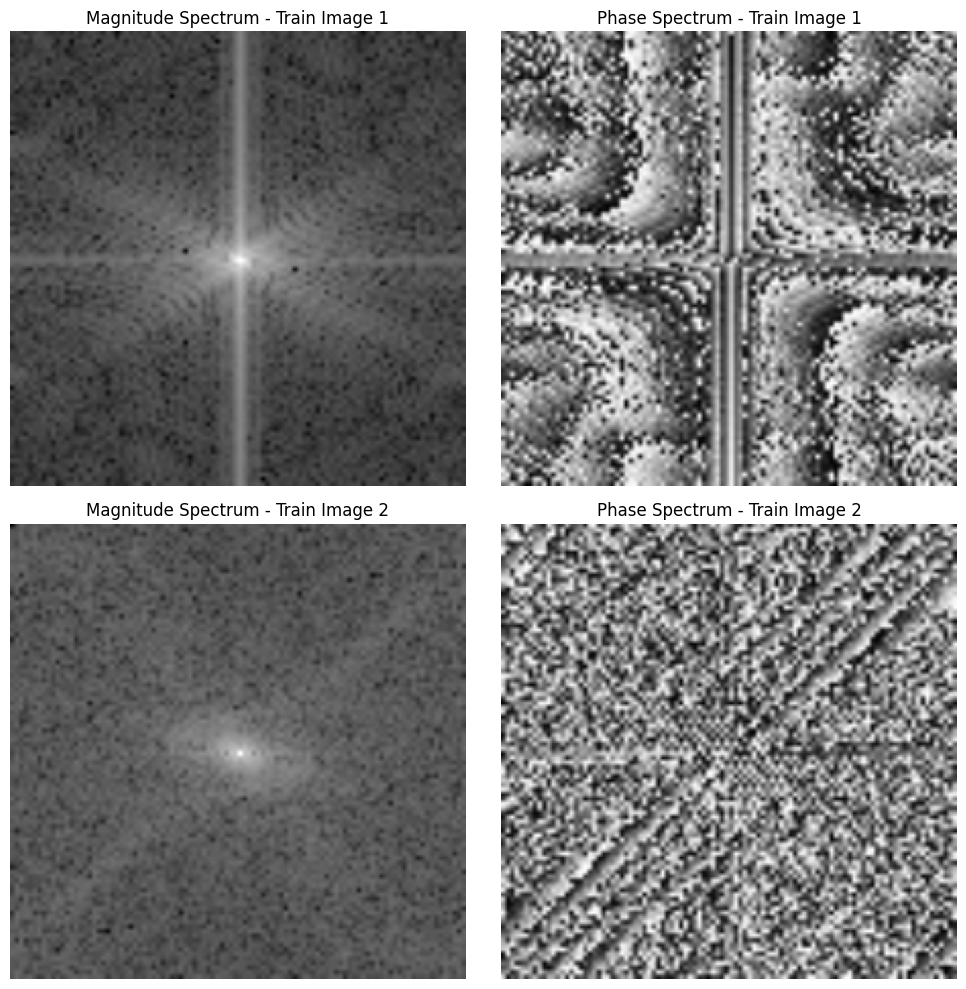

In [ ]:
import matplotlib.pyplot as plt

def visualize_fourier_transforms(images, titles=None):
    if titles is None:
        titles = [f'Image {i+1}' for i in range(len(images))]

    num_images = len(images)

    # Create subplots
    fig, axes = plt.subplots(num_images, 2, figsize=(10, num_images * 5))

    for i in range(num_images):
        magnitude = images[i][:, :, 0]  # First channel: Magnitude
        phase = images[i][:, :, 1]      # Second channel: Phase

        # Plot Magnitude
        axes[i, 0].imshow(magnitude, cmap='gray')
        axes[i, 0].set_title(f'Magnitude Spectrum - {titles[i]}')
        axes[i, 0].axis('off')

        # Plot Phase
        axes[i, 1].imshow(phase, cmap='gray')
        axes[i, 1].set_title(f'Phase Spectrum - {titles[i]}')
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
# Visualizing the first two Fourier-transformed images from the training dataset
visualize_fourier_transforms(train_images_fourier[:2], titles=['Train Image 1', 'Train Image 2'])


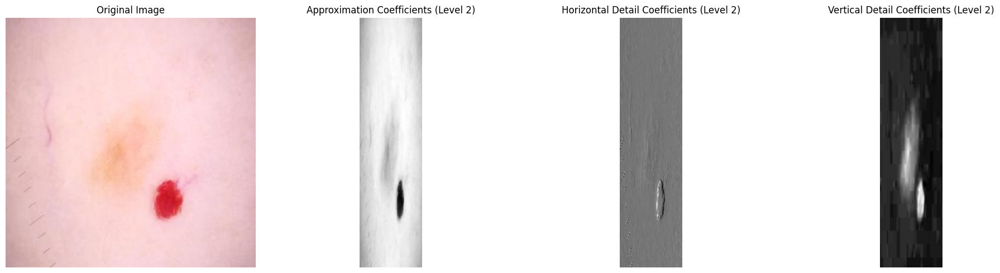

Fourier Energy: 11367939117600.004
Wavelet Energy: 16195054001.062506


In [ ]:
def plot_histogram(data, title):
    plt.figure(figsize=(8, 4))
    plt.hist(data.ravel(), bins=50, color='blue', alpha=0.7)
    plt.title(title)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.grid()
    plt.show()

def calculate_energy(magnitude):
    return np.sum(magnitude ** 2)

fourier_energy = calculate_energy(magnitude_spectrum)
wavelet_energy = calculate_energy(cA)

print(f"Fourier Energy: {fourier_energy}")
print(f"Wavelet Energy: {wavelet_energy}")
plot_histogram(magnitude_spectrum, 'Fourier Magnitude Spectrum Histogram')
plot_histogram(cA, 'Wavelet Approximation Coefficients Histogram')


Fourier Energy: 1763530.798365042
Wavelet Energy: 192692391.3125001


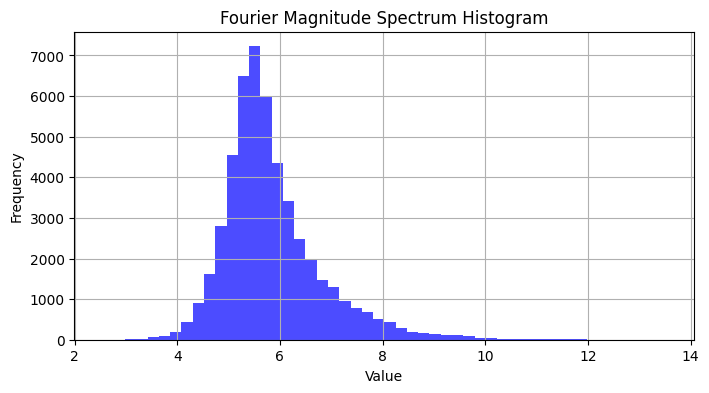

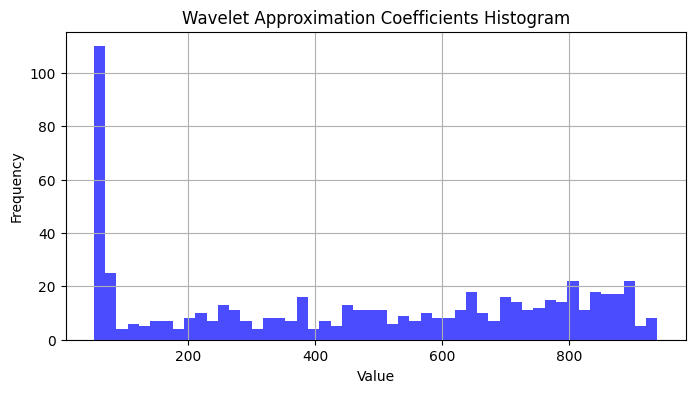

NameError: name 'visualize_transform_comparison' is not defined

In [ ]:
# Updated apply_wavelet_transform function
def apply_wavelet_transform(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # Convert to grayscale

    # Apply 2D Wavelet Transform
    coeffs2 = pywt.wavedec2(gray, 'haar', level=2)  # Change 'haar' to any wavelet of your choice

    # Extracting coefficients
    cA = coeffs2[0]  # Approximation coefficients
    cH = coeffs2[1][0]  # Horizontal detail coefficients
    cV = coeffs2[1][1]  # Vertical detail coefficients
    cD = coeffs2[1][2]  # Diagonal detail coefficients

    # Normalize and resize the coefficients
    cA_resized = cv2.resize(cA, (224, 224))
    cH_resized = cv2.resize(cH, (224, 224))
    cV_resized = cv2.resize(cV, (224, 224))
    cD_resized = cv2.resize(cD, (224, 224))

    # Combine coefficients into a single image for visualization
    combined_wavelet = np.stack([cA_resized, cH_resized, cV_resized, cD_resized], axis=-1)

    return combined_wavelet, cA, cH, cV, cD  # Return coefficients separately

# Example usage
# Assuming you have an image from your dataset and have already processed it
image_index = 0  # Change this index to visualize a different image
original_image = train_images[image_index]
magnitude_spectrum, phase_spectrum = apply_full_fourier_transform(original_image)
wavelet_image, cA, cH, cV, cD = apply_wavelet_transform(original_image)  # Get coefficients

# Calculate energy for Fourier and Wavelet
fourier_energy = calculate_energy(magnitude_spectrum)
wavelet_energy = calculate_energy(cA)  # Now cA is defined

print(f"Fourier Energy: {fourier_energy}")
print(f"Wavelet Energy: {wavelet_energy}")

# Plot histograms for the magnitude spectrum and approximation coefficients
plot_histogram(magnitude_spectrum, 'Fourier Magnitude Spectrum Histogram')
plot_histogram(cA, 'Wavelet Approximation Coefficients Histogram')

# Visualize the comparison
visualize_transform_comparison(original_image, (magnitude_spectrum, phase_spectrum), wavelet_image)


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


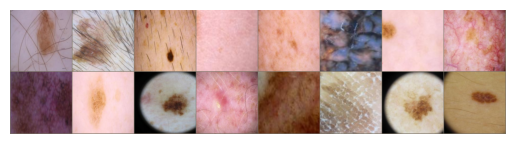

benign, malignant, benign, benign, benign, malignant, benign, benign, benign, benign, malignant, benign, benign, malignant, malignant, malignant


In [ ]:
from torchvision.utils import make_grid

images, labels = next(iter(train_loader))
imshow(make_grid(images))
print(', '.join(f'{train_loader.dataset.classes[labels[i]]}' for i in range(len(labels))))


# SpectraViT

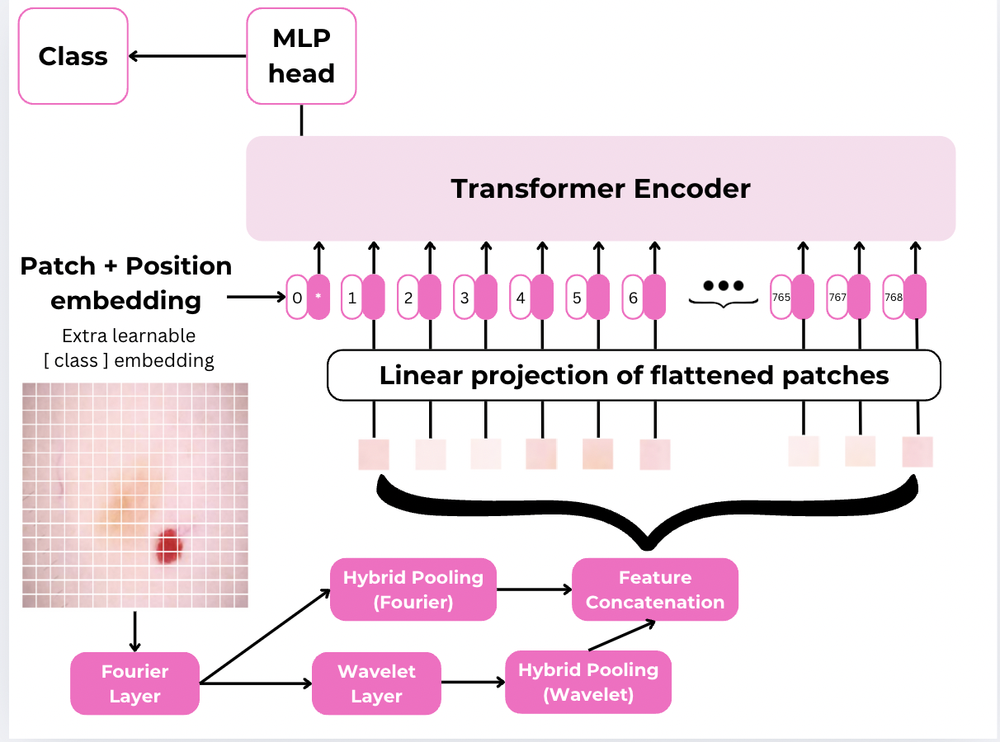

In [ ]:
import torc
import torch.nn as nn
import torchvision.transforms as transforms
from timm import create_model


### SpectraViT Architecture

The architecture of **SpectraViT** is designed to explore the best of the strengths of both mathematical transforms: the Fourier Transform (capturing global features) and Wavelet Transforms (capturing localized features). As shown in **Figure 1**, the model comprises the following main components:

- **Fourier Layer**
- **Wavelet Layer**
- **Hybrid Pooling Layer**
- **Vision Transformer (ViT)**


In [ ]:
class FourierLayer(nn.Module):
    def __init__(self):
        super(FourierLayer, self).__init__()

    def forward(self, x):
        x_fft = torch.fft.fft2(x)
        x_fft = torch.abs(x_fft)
        return x_fft

class WaveletLayer(nn.Module):
    def __init__(self):
        super(WaveletLayer, self).__init__()

    def forward(self, x):
        batch_size, channels, height, width = x.shape
        wavelet_features = []

        for i in range(batch_size):
            coeffs2 = pywt.wavedec2(x[i].cpu().detach().numpy(), 'haar', level=2)
            cA = coeffs2[0]
            wavelet_features.append(torch.tensor(cA).unsqueeze(0).to(x.device))

        wavelet_output = torch.cat(wavelet_features, dim=0)
        return wavelet_output


In [ ]:
class HybridPoolingLayer(nn.Module):
    def __init__(self):
        super(HybridPoolingLayer, self).__init__()

    def forward(self, x):
        max_pooled = F.max_pool2d(x, kernel_size=2, stride=2)
        avg_pooled = F.avg_pool2d(x, kernel_size=2, stride=2)
        hybrid_output = torch.cat((max_pooled, avg_pooled), dim=1)
        return hybrid_output

In [ ]:
class SpectraViT(nn.Module):
    def __init__(self, embed_dim=768):
        super(SpectraViT, self).__init__()
        self.vit = models.vit_b_16(weights=models.ViT_B_16_Weights.DEFAULT)
        self.embed_dim = embed_dim

        # Fourier and Wavelet Transform layers
        self.fourier_layer = FourierLayer()
        self.wavelet_layer = WaveletLayer()

        # Hybrid pooling layer
        self.hybrid_pool = HybridPoolingLayer()

        # Define combined dimensions based on actual pooling output
        self.fourier_output_channels = 6
        self.wavelet_output_channels = 6
        combined_dim = (self.fourier_output_channels * 112 * 112) + (self.wavelet_output_channels * 28 * 28)
        self.project = nn.Linear(combined_dim, self.embed_dim)

        # Classification head
        self.classifier = nn.Linear(self.embed_dim, 2)

    def forward(self, x):
        x_fourier = self.fourier_layer(x)
        x_wavelet = self.wavelet_layer(x)


        x_fourier_pooled = self.hybrid_pool(x_fourier)
        x_wavelet_pooled = self.hybrid_pool(x_wavelet)

        x_fourier_flat = x_fourier_pooled.view(x.size(0), -1)
        x_wavelet_flat = x_wavelet_pooled.view(x.size(0), -1)

        x_combined = torch.cat((x_fourier_flat, x_wavelet_flat), dim=1)

        x_projected = self.project(x_combined)

        x_projected = x_projected.unsqueeze(1)

        x_vit = self.vit.encoder(x_projected)


        x_class = self.classifier(x_vit[:, 0, :])  # Class token output
        return x_class

Training and validation

In [ ]:
data_transforms = transforms.Compose([ transforms.RandomResizedCrop(224, scale=(0.8, 1.0)), transforms.RandomHorizontalFlip(), transforms.RandomRotation(10),
transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1), transforms.ToTensor(),
])

train_data_path =
'/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train' train_dataset = datasets.ImageFolder(train_data_path, transform=data_transforms)

train_size = int(0.8 * len(train_dataset))
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = random_split(train_dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SpectraViT().to(device)


optimizer = optim.AdamW(model.parameters(), lr=0.00005, weight_decay=1e-4)
num_epochs = 30
scheduler = CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=1e-6)

criterion = nn.CrossEntropyLoss()

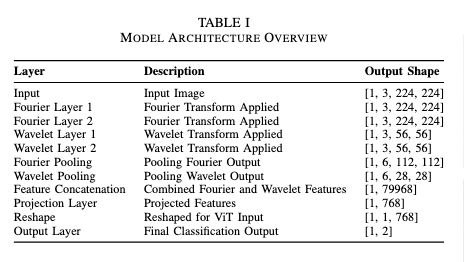

Fourier Layer Output Shape: torch.Size([1, 3, 224, 224])
Fourier Layer Output Shape: torch.Size([1, 3, 224, 224])
Wavelet Layer Output Shape: torch.Size([1, 3, 56, 56])
Wavelet Layer Output Shape: torch.Size([1, 3, 56, 56])
Fourier Pooled Output Shape: torch.Size([1, 6, 112, 112])
Wavelet Pooled Output Shape: torch.Size([1, 6, 28, 28])
Combined Feature Shape Before Projection: torch.Size([1, 79968])
Projected Feature Shape: torch.Size([1, 768])
Reshaped Projected Feature for ViT: torch.Size([1, 1, 768])
torch.Size([1, 2])
Predicted Probabilities: tensor([[0.6291, 0.3709]], device='cuda:0')


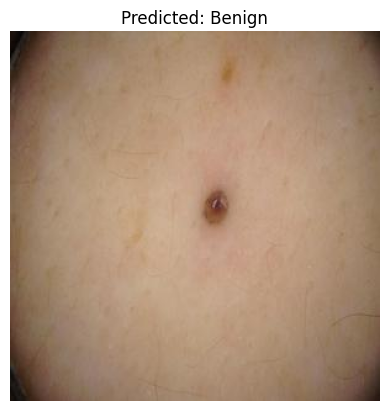

In [ ]:
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = SpectraViT().to(device)
model.eval()

image_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train/malignant/melanoma_8452.jpg'
image = Image.open(image_path).convert('RGB')

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

image_tensor = transform(image).unsqueeze(0).to(device)  #
with torch.no_grad():
    outputs = model(image_tensor)
print(outputs.shape)
probabilities = torch.nn.functional.softmax(outputs, dim=1)
print("Predicted Probabilities:", probabilities)
plt.imshow(image)
plt.axis('off')
plt.title(f"Predicted: {'Malignant' if probabilities[0, 1] > 0.5 else 'Benign'}")
plt.show()


TRIAL 1 with learning rate 0.01

# MAIN

**trial lr 0.00005 epochs 30**

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
from torch.optim.lr_scheduler import CosineAnnealingLR

class SpectraViT(nn.Module):
    def __init__(self, embed_dim=768):
        super(SpectraViT, self).__init__()
        self.vit = models.vit_b_16(weights=models.ViT_B_16_Weights.DEFAULT)
        self.embed_dim = embed_dim
        self.fourier_layer = FourierLayer()
        self.wavelet_layer = WaveletLayer()
        self.hybrid_pool = HybridPoolingLayer()
        self.fourier_output_channels = 6
        self.wavelet_output_channels = 6
        combined_dim = (self.fourier_output_channels * 112 * 112) + (self.wavelet_output_channels * 28 * 28)
        self.project = nn.Sequential(
            nn.Linear(combined_dim, self.embed_dim),
            nn.BatchNorm1d(self.embed_dim),
            nn.ReLU()
        )
        self.classifier = nn.Linear(self.embed_dim, 2)

    def forward(self, x):
        x_fourier = self.fourier_layer(x)
        x_wavelet = self.wavelet_layer(x)
        x_fourier_pooled = self.hybrid_pool(x_fourier)
        x_wavelet_pooled = self.hybrid_pool(x_wavelet)
        x_fourier_flat = x_fourier_pooled.view(x.size(0), -1)
        x_wavelet_flat = x_wavelet_pooled.view(x.size(0), -1)
        x_combined = torch.cat((x_fourier_flat, x_wavelet_flat), dim=1)
        x_projected = self.project(x_combined)
        x_projected = x_projected.unsqueeze(1)
        x_vit = self.vit.encoder(x_projected)
        x_class = self.classifier(x_vit[:, 0, :])
        return x_class

data_transforms = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
])

train_data_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train'
train_dataset = datasets.ImageFolder(train_data_path, transform=data_transforms)

train_size = int(0.8 * len(train_dataset))
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = random_split(train_dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SpectraViT().to(device)


optimizer = optim.AdamW(model.parameters(), lr=0.00005, weight_decay=1e-4)
num_epochs = 30
scheduler = CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=1e-6)

criterion = nn.CrossEntropyLoss()

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    with tqdm(train_loader, unit="batch", desc=f"Training Epoch [{epoch + 1}/{num_epochs}]") as tepoch:
        for images, labels in tepoch:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), max_norm=2.0)
            optimizer.step()
            running_loss += loss.item()
            tepoch.set_postfix(loss=running_loss / (tepoch.n + 1))

    scheduler.step()
    train_loss = running_loss / len(train_loader)

    # Validation phase
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    val_loss /= len(val_loader)
    val_accuracy = correct / total * 100

    print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss : {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%")

print("Training Complete")

Training Epoch [1/30]: 100%|██████████| 241/241 [03:59<00:00,  1.01batch/s, loss=0.388]


Epoch [1/30], Train Loss : 0.3881, Val Loss: 0.3898, Val Accuracy: 84.44%


Training Epoch [2/30]: 100%|██████████| 241/241 [03:56<00:00,  1.02batch/s, loss=0.331]


Epoch [2/30], Train Loss : 0.3314, Val Loss: 0.3289, Val Accuracy: 86.62%


Training Epoch [3/30]: 100%|██████████| 241/241 [03:56<00:00,  1.02batch/s, loss=0.318]


Epoch [3/30], Train Loss : 0.3184, Val Loss: 0.3467, Val Accuracy: 86.05%


Training Epoch [4/30]: 100%|██████████| 241/241 [03:56<00:00,  1.02batch/s, loss=0.312]


Epoch [4/30], Train Loss : 0.3122, Val Loss: 0.2932, Val Accuracy: 87.61%


Training Epoch [5/30]: 100%|██████████| 241/241 [03:57<00:00,  1.02batch/s, loss=0.291]


Epoch [5/30], Train Loss : 0.2906, Val Loss: 0.2691, Val Accuracy: 88.50%


Training Epoch [6/30]: 100%|██████████| 241/241 [03:58<00:00,  1.01batch/s, loss=0.287]


Epoch [6/30], Train Loss : 0.2870, Val Loss: 0.2987, Val Accuracy: 88.81%


Training Epoch [7/30]: 100%|██████████| 241/241 [03:59<00:00,  1.01batch/s, loss=0.295]


Epoch [7/30], Train Loss : 0.2953, Val Loss: 0.2711, Val Accuracy: 88.91%


Training Epoch [8/30]: 100%|██████████| 241/241 [03:59<00:00,  1.01batch/s, loss=0.281]


Epoch [8/30], Train Loss : 0.2814, Val Loss: 0.2426, Val Accuracy: 89.33%


Training Epoch [9/30]: 100%|██████████| 241/241 [03:58<00:00,  1.01batch/s, loss=0.278]


Epoch [9/30], Train Loss : 0.2777, Val Loss: 0.2763, Val Accuracy: 87.77%


Training Epoch [10/30]: 100%|██████████| 241/241 [03:58<00:00,  1.01batch/s, loss=0.27] 


Epoch [10/30], Train Loss : 0.2704, Val Loss: 0.3001, Val Accuracy: 86.26%


Training Epoch [11/30]: 100%|██████████| 241/241 [03:59<00:00,  1.01batch/s, loss=0.264]


Epoch [11/30], Train Loss : 0.2640, Val Loss: 0.2639, Val Accuracy: 89.02%


Training Epoch [12/30]: 100%|██████████| 241/241 [03:59<00:00,  1.01batch/s, loss=0.261]


Epoch [12/30], Train Loss : 0.2610, Val Loss: 0.2714, Val Accuracy: 89.28%


Training Epoch [13/30]: 100%|██████████| 241/241 [03:58<00:00,  1.01batch/s, loss=0.262]


Epoch [13/30], Train Loss : 0.2619, Val Loss: 0.2696, Val Accuracy: 90.16%


Training Epoch [14/30]: 100%|██████████| 241/241 [03:59<00:00,  1.01batch/s, loss=0.256]


Epoch [14/30], Train Loss : 0.2563, Val Loss: 0.2662, Val Accuracy: 89.02%


Training Epoch [15/30]: 100%|██████████| 241/241 [03:59<00:00,  1.01batch/s, loss=0.253]


Epoch [15/30], Train Loss : 0.2528, Val Loss: 0.2357, Val Accuracy: 90.11%


Training Epoch [16/30]: 100%|██████████| 241/241 [03:58<00:00,  1.01batch/s, loss=0.252]


Epoch [16/30], Train Loss : 0.2516, Val Loss: 0.2366, Val Accuracy: 90.16%


Training Epoch [17/30]: 100%|██████████| 241/241 [03:58<00:00,  1.01batch/s, loss=0.246]


Epoch [17/30], Train Loss : 0.2458, Val Loss: 0.2455, Val Accuracy: 89.69%


Training Epoch [18/30]: 100%|██████████| 241/241 [04:00<00:00,  1.00batch/s, loss=0.24] 


Epoch [18/30], Train Loss : 0.2398, Val Loss: 0.2393, Val Accuracy: 90.01%


Training Epoch [19/30]: 100%|██████████| 241/241 [03:57<00:00,  1.01batch/s, loss=0.243]


Epoch [19/30], Train Loss : 0.2434, Val Loss: 0.2348, Val Accuracy: 90.79%


Training Epoch [20/30]: 100%|██████████| 241/241 [03:59<00:00,  1.01batch/s, loss=0.228]


Epoch [20/30], Train Loss : 0.2284, Val Loss: 0.2263, Val Accuracy: 90.79%


Training Epoch [21/30]: 100%|██████████| 241/241 [04:00<00:00,  1.00batch/s, loss=0.236]


Epoch [21/30], Train Loss : 0.2364, Val Loss: 0.2449, Val Accuracy: 90.32%


Training Epoch [22/30]: 100%|██████████| 241/241 [03:59<00:00,  1.00batch/s, loss=0.232]


Epoch [22/30], Train Loss : 0.2324, Val Loss: 0.2311, Val Accuracy: 91.05%


Training Epoch [23/30]: 100%|██████████| 241/241 [03:59<00:00,  1.01batch/s, loss=0.23] 


Epoch [23/30], Train Loss : 0.2300, Val Loss: 0.2265, Val Accuracy: 90.73%


Training Epoch [24/30]: 100%|██████████| 241/241 [04:00<00:00,  1.00batch/s, loss=0.225]


Epoch [24/30], Train Loss : 0.2253, Val Loss: 0.2226, Val Accuracy: 91.20%


Training Epoch [25/30]: 100%|██████████| 241/241 [04:00<00:00,  1.00batch/s, loss=0.225]


Epoch [25/30], Train Loss : 0.2254, Val Loss: 0.2329, Val Accuracy: 90.68%


Training Epoch [26/30]: 100%|██████████| 241/241 [04:00<00:00,  1.00batch/s, loss=0.219]


Epoch [26/30], Train Loss : 0.2190, Val Loss: 0.2289, Val Accuracy: 91.67%


Training Epoch [27/30]: 100%|██████████| 241/241 [04:00<00:00,  1.00batch/s, loss=0.224]


Epoch [27/30], Train Loss : 0.2235, Val Loss: 0.2234, Val Accuracy: 90.68%


Training Epoch [28/30]: 100%|██████████| 241/241 [04:04<00:00,  1.01s/batch, loss=0.225]


Epoch [28/30], Train Loss : 0.2251, Val Loss: 0.2303, Val Accuracy: 91.20%


Training Epoch [29/30]: 100%|██████████| 241/241 [03:59<00:00,  1.01batch/s, loss=0.222]


Epoch [29/30], Train Loss : 0.2219, Val Loss: 0.2257, Val Accuracy: 90.58%


Training Epoch [30/30]: 100%|██████████| 241/241 [03:59<00:00,  1.01batch/s, loss=0.217]


Epoch [30/30], Train Loss : 0.2173, Val Loss: 0.2286, Val Accuracy: 90.73%
Training Complete


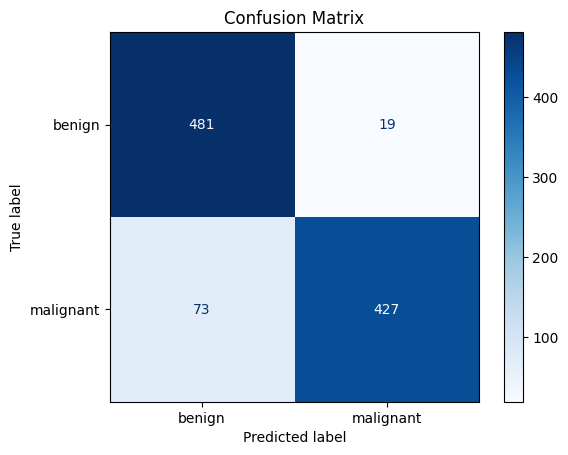

Classification Report:
              precision    recall  f1-score   support

      benign       0.87      0.96      0.91       500
   malignant       0.96      0.85      0.90       500

    accuracy                           0.91      1000
   macro avg       0.91      0.91      0.91      1000
weighted avg       0.91      0.91      0.91      1000



In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
def plot_metrics(test_labels, test_predictions):
    cm = confusion_matrix(test_labels, test_predictions)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_dataset.classes)
    disp.plot(cmap='Blues')
    plt.title("Confusion Matrix")
    plt.show()
    print("Classification Report:")
    print(classification_report(test_labels, test_predictions, target_names=test_dataset.classes))
plot_metrics(test_labels, test_predictions)


In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

def plot_roc_curve(test_labels, test_probs):

    fpr, tpr, _ = roc_curve(test_labels, test_probs[:, 1])  # test_probs[:, 1] assumes class 1 is the positive class
    roc_auc = auc(fpr, tpr)

    # Plot ROC curve
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Diagonal line for random performance
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()


In [ ]:
test_labels, test_predictions, test_probs = test_model(model, test_loader)


Testing: 100%|██████████| 32/32 [00:11<00:00,  2.78batch/s]

Testing completed. Accuracy: 90.80%


In [ ]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from tqdm import tqdm

test_data = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test'

test_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

test_dataset = datasets.ImageFolder(test_data, transform=test_transforms)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

def test_model(model, test_loader):
    model.eval()
    correct = 0
    total = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(test_loader, desc="Testing", unit="batch"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    accuracy = 100 * correct / total
    print(f"Testing completed. Accuracy: {accuracy:.2f}%")
    return all_labels, all_preds

test_labels, test_predictions = test_model(model, test_loader)

Testing: 100%|██████████| 32/32 [00:15<00:00,  2.12batch/s]

Testing completed. Accuracy: 90.80%


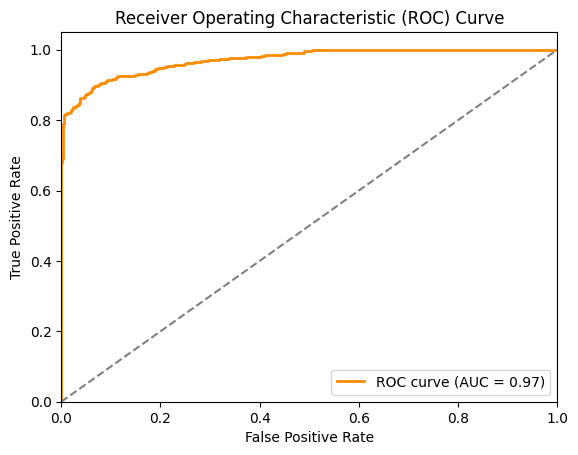

In [ ]:
plot_roc_curve(test_labels, test_probs)

In [ ]:
def test_model(model, test_loader):
    model.eval()
    correct = 0
    total = 0
    all_preds = []
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for images, labels in tqdm(test_loader, desc="Testing", unit="batch"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)  # Get class probabilities
            _, predicted = torch.max(outputs.data, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())  # Save probabilities for ROC curve

    accuracy = 100 * correct / total
    print(f"Testing completed. Accuracy: {accuracy:.2f}%")
    return all_labels, all_preds, np.array(all_probs)


**trial lr 0.0001 and epochs 20**

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
from torch.optim.lr_scheduler import CosineAnnealingLR

class SpectraViT(nn.Module):
    def __init__(self, embed_dim=768):
        super(SpectraViT, self).__init__()
        self.vit = models.vit_b_16(weights=models.ViT_B_16_Weights.DEFAULT)
        self.embed_dim = embed_dim
        self.fourier_layer = FourierLayer()
        self.wavelet_layer = WaveletLayer()
        self.hybrid_pool = HybridPoolingLayer()
        self.fourier_output_channels = 6
        self.wavelet_output_channels = 6
        combined_dim = (self.fourier_output_channels * 112 * 112) + (self.wavelet_output_channels * 28 * 28)
        self.project = nn.Sequential(
            nn.Linear(combined_dim, self.embed_dim),
            nn.BatchNorm1d(self.embed_dim),
            nn.ReLU()
        )
        self.classifier = nn.Linear(self.embed_dim, 2)

    def forward(self, x):
        x_fourier = self.fourier_layer(x)
        x_wavelet = self.wavelet_layer(x)
        x_fourier_pooled = self.hybrid_pool(x_fourier)
        x_wavelet_pooled = self.hybrid_pool(x_wavelet)
        x_fourier_flat = x_fourier_pooled.view(x.size(0), -1)
        x_wavelet_flat = x_wavelet_pooled.view(x.size(0), -1)
        x_combined = torch.cat((x_fourier_flat, x_wavelet_flat), dim=1)
        x_projected = self.project(x_combined)
        x_projected = x_projected.unsqueeze(1)
        x_vit = self.vit.encoder(x_projected)
        x_class = self.classifier(x_vit[:, 0, :])
        return x_class

data_transforms = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
])

train_data_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train'
train_dataset = datasets.ImageFolder(train_data_path, transform=data_transforms)

train_size = int(0.8 * len(train_dataset))
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = random_split(train_dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SpectraViT().to(device)


optimizer = optim.AdamW(model.parameters(), lr=0.0001, weight_decay=1e-4)
num_epochs = 20
scheduler = CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=1e-6)

criterion = nn.CrossEntropyLoss()

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    with tqdm(train_loader, unit="batch", desc=f"Training Epoch [{epoch + 1}/{num_epochs}]") as tepoch:
        for images, labels in tepoch:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), max_norm=2.0)
            optimizer.step()
            running_loss += loss.item()
            tepoch.set_postfix(loss=running_loss / (tepoch.n + 1))

    scheduler.step()
    train_loss = running_loss / len(train_loader)

    # Validation phase
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    val_loss /= len(val_loader)
    val_accuracy = correct / total * 100

    print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss : {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%")

print("Training Complete")

Training Epoch [1/20]: 100%|██████████| 241/241 [05:18<00:00,  1.32s/batch, loss=0.413]


Epoch [1/20], Train Loss: 0.4132, Val Loss: 0.3771, Val Accuracy: 82.77%


Training Epoch [2/20]: 100%|██████████| 241/241 [04:03<00:00,  1.01s/batch, loss=0.341]


Epoch [2/20], Train Loss: 0.3412, Val Loss: 0.3107, Val Accuracy: 87.30%


Training Epoch [3/20]: 100%|██████████| 241/241 [04:04<00:00,  1.02s/batch, loss=0.314]


Epoch [3/20], Train Loss: 0.3138, Val Loss: 0.3088, Val Accuracy: 87.71%


Training Epoch [4/20]: 100%|██████████| 241/241 [04:03<00:00,  1.01s/batch, loss=0.312]


Epoch [4/20], Train Loss: 0.3117, Val Loss: 0.2926, Val Accuracy: 87.87%


Training Epoch [5/20]: 100%|██████████| 241/241 [04:00<00:00,  1.00batch/s, loss=0.295]


Epoch [5/20], Train Loss: 0.2948, Val Loss: 0.2884, Val Accuracy: 87.35%


Training Epoch [6/20]: 100%|██████████| 241/241 [04:02<00:00,  1.01s/batch, loss=0.291]


Epoch [6/20], Train Loss: 0.2911, Val Loss: 0.3215, Val Accuracy: 85.53%


Training Epoch [7/20]: 100%|██████████| 241/241 [03:59<00:00,  1.01batch/s, loss=0.28] 


Epoch [7/20], Train Loss: 0.2795, Val Loss: 0.2679, Val Accuracy: 89.28%


Training Epoch [8/20]: 100%|██████████| 241/241 [03:58<00:00,  1.01batch/s, loss=0.281]


Epoch [8/20], Train Loss: 0.2815, Val Loss: 0.2942, Val Accuracy: 86.93%


Training Epoch [9/20]: 100%|██████████| 241/241 [04:00<00:00,  1.00batch/s, loss=0.277]


Epoch [9/20], Train Loss: 0.2767, Val Loss: 0.3542, Val Accuracy: 86.57%


Training Epoch [10/20]: 100%|██████████| 241/241 [03:59<00:00,  1.01batch/s, loss=0.264]


Epoch [10/20], Train Loss: 0.2640, Val Loss: 0.2363, Val Accuracy: 90.89%


Training Epoch [11/20]: 100%|██████████| 241/241 [04:02<00:00,  1.01s/batch, loss=0.26] 


Epoch [11/20], Train Loss: 0.2596, Val Loss: 0.2495, Val Accuracy: 89.74%


Training Epoch [12/20]: 100%|██████████| 241/241 [03:59<00:00,  1.01batch/s, loss=0.256]


Epoch [12/20], Train Loss: 0.2564, Val Loss: 0.2432, Val Accuracy: 89.95%


Training Epoch [13/20]: 100%|██████████| 241/241 [04:01<00:00,  1.00s/batch, loss=0.252]


Epoch [13/20], Train Loss: 0.2522, Val Loss: 0.2381, Val Accuracy: 90.01%


Training Epoch [14/20]: 100%|██████████| 241/241 [04:02<00:00,  1.01s/batch, loss=0.255]


Epoch [14/20], Train Loss: 0.2554, Val Loss: 0.2461, Val Accuracy: 89.48%


Training Epoch [15/20]:  75%|███████▍  | 180/241 [03:03<01:01,  1.02s/batch, loss=0.244]

Epoch [15/20], Train Loss: 0.2499, Val Loss: 0.2447, Val Accuracy: 89.07%


Training Epoch [16/20]: 100%|██████████| 241/241 [04:14<00:00,  1.06s/batch, loss=0.241]


Epoch [16/20], Train Loss: 0.2412, Val Loss: 0.2407, Val Accuracy: 90.27%


Training Epoch [17/20]: 100%|██████████| 241/241 [04:02<00:00,  1.01s/batch, loss=0.239]


Epoch [17/20], Train Loss: 0.2392, Val Loss: 0.2331, Val Accuracy: 90.11%


Training Epoch [18/20]: 100%|██████████| 241/241 [04:03<00:00,  1.01s/batch, loss=0.243]


Epoch [18/20], Train Loss: 0.2425, Val Loss: 0.2412, Val Accuracy: 89.59%


Training Epoch [19/20]: 100%|██████████| 241/241 [04:04<00:00,  1.01s/batch, loss=0.235]


Epoch [19/20], Train Loss: 0.2352, Val Loss: 0.2315, Val Accuracy: 90.21%


Training Epoch [20/20]: 100%|██████████| 241/241 [04:05<00:00,  1.02s/batch, loss=0.238]


Epoch [20/20], Train Loss: 0.2382, Val Loss: 0.2323, Val Accuracy: 89.95%
Training Complete


In [ ]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from tqdm import tqdm

test_data = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test'

test_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

test_dataset = datasets.ImageFolder(test_data, transform=test_transforms)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

def test_model(model, test_loader):
    model.eval()
    correct = 0
    total = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(test_loader, desc="Testing", unit="batch"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    accuracy = 100 * correct / total
    print(f"Testing completed. Accuracy: {accuracy:.2f}%")
    return all_labels, all_preds

test_labels, test_predictions = test_model(model, test_loader)

Testing: 100%|██████████| 32/32 [00:17<00:00,  1.82batch/s]

Testing completed. Accuracy: 91.00%


In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torchvision import models
from PIL import Image
import pywt

# Assuming the FourierLayer, WaveletLayer, and HybridPoolingLayer classes are defined as before
class FourierLayer(nn.Module):
    def __init__(self):
        super(FourierLayer, self).__init__()

    def forward(self, x):
        x_fft = torch.fft.fft2(x)  # 2D FFT for each channel
        x_fft = torch.fft.fftshift(x_fft)  # Center zero frequency component
        x_magnitude = torch.abs(x_fft)
        x_phase = torch.angle(x_fft)
        x_combined = torch.cat((x_magnitude, x_phase), dim=1)  # Double channels (mag + phase)
        return x_combined

class WaveletLayer(nn.Module):
    def __init__(self, wavelet='haar', level=2):
        super(WaveletLayer, self).__init__()
        self.wavelet = wavelet
        self.level = level

    def forward(self, x):
        batch_size, channels, height, width = x.shape
        wavelet_features = []

        for i in range(batch_size):
            channel_features = []
            for ch in range(channels):
                coeffs2 = pywt.wavedec2(x[i, ch].cpu().numpy(), self.wavelet, level=self.level)
                cA = coeffs2[0]  # Extract approximation coefficients
                channel_features.append(torch.tensor(cA, device=x.device).unsqueeze(0))

            wavelet_features.append(torch.cat(channel_features, dim=0).unsqueeze(0))

        wavelet_output = torch.cat(wavelet_features, dim=0)
        return wavelet_output

class HybridPoolingLayer(nn.Module):
    def __init__(self):
        super(HybridPoolingLayer, self).__init__()

    def forward(self, x):
        max_pooled = F.max_pool2d(x, kernel_size=2, stride=2)
        avg_pooled = F.avg_pool2d(x, kernel_size=2, stride=2)
        hybrid_output = torch.cat((max_pooled, avg_pooled), dim=1)
        return hybrid_output

class SpectraViT(nn.Module):
    def __init__(self, embed_dim=768):
        super(SpectraViT, self).__init__()
        self.vit = models.vit_b_16(weights=models.ViT_B_16_Weights.DEFAULT)
        self.embed_dim = embed_dim
        self.fourier_layer = FourierLayer()
        self.wavelet_layer = WaveletLayer()
        self.hybrid_pool = HybridPoolingLayer()
        self.dropout = nn.Dropout(p=0.3)
        self.classifier = nn.Linear(self.embed_dim, 2)

    def forward(self, x):
        x_fourier = self.fourier_layer(x)
        x_wavelet = self.wavelet_layer(x)
        x_fourier_pooled = self.hybrid_pool(x_fourier)
        x_wavelet_pooled = self.hybrid_pool(x_wavelet)

        # Flatten and concatenate features
        x_fourier_flat = x_fourier_pooled.view(x.size(0), -1)
        x_wavelet_flat = x_wavelet_pooled.view(x.size(0), -1)
        x_combined = torch.cat((x_fourier_flat, x_wavelet_flat), dim=1)

        # Project to ViT embedding dimension
        combined_dim = x_combined.size(1)
        self.project = nn.Linear(combined_dim, self.embed_dim).to(x.device)  # Ensure projection layer is on the same device
        x_projected = self.project(x_combined).unsqueeze(1)

        # Feed into ViT
        x_vit = self.vit.encoder(x_projected)
        x_class = self.classifier(self.dropout(x_vit[:, 0, :]))  # Class token output
        return x_class

# Load the image
image_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train/benign/melanoma_805.jpg'
image = Image.open(image_path)

# Preprocess the image
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

image_tensor = transform(image).unsqueeze(0)  # Add batch dimension

# Instantiate the model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SpectraViT().to(device)
model.eval()  # Set the model to evaluation mode

# Run the model on the image
with torch.no_grad():  # Disable gradient calculation
    image_tensor = image_tensor.to(device)
    output = model(image_tensor)

# Print the output
print("Model Output:", output)


Model Output: tensor([[0.0248, 0.3910]], device='cuda:0')


Fourier Layer Output Shape (Magnitude + Phase): torch.Size([1, 6, 224, 224])
Wavelet Layer Output Shape: torch.Size([1, 3, 56, 56])
Hybrid Pooling Layer Output Shape: torch.Size([1, 12, 112, 112])
Hybrid Pooling Layer Output Shape: torch.Size([1, 6, 28, 28])
Final Hybrid Output (Fourier): torch.Size([1, 12, 112, 112])
Final Hybrid Output (Wavelet): torch.Size([1, 6, 28, 28])


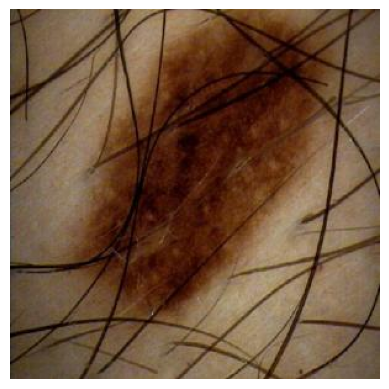

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import pywt

# Define Fourier Layer
class FourierLayer(nn.Module):
    def __init__(self):
        super(FourierLayer, self).__init__()

    def forward(self, x):
        # Apply centered FFT shift for better spatial understanding
        x_fft = torch.fft.fft2(x)  # 2D FFT for each channel
        x_fft = torch.fft.fftshift(x_fft)  # Center zero frequency component

        # Calculate magnitude and phase
        x_magnitude = torch.abs(x_fft)
        x_phase = torch.angle(x_fft)

        # Concatenate magnitude and phase
        x_combined = torch.cat((x_magnitude, x_phase), dim=1)  # Double channels (mag + phase)

        print(f"Fourier Layer Output Shape (Magnitude + Phase): {x_combined.shape}")  # Debug statement
        return x_combined

# Define Wavelet Layer
class WaveletLayer(nn.Module):
    def __init__(self, wavelet='haar', level=2):
        super(WaveletLayer, self).__init__()
        self.wavelet = wavelet
        self.level = level

    def forward(self, x):
        batch_size, channels, height, width = x.shape
        wavelet_features = []

        for i in range(batch_size):
            # For each image in the batch, perform 2D wavelet decomposition on each channel
            channel_features = []
            for ch in range(channels):
                coeffs2 = pywt.wavedec2(x[i, ch].cpu().numpy(), self.wavelet, level=self.level)
                cA = coeffs2[0]  # Extract approximation coefficients
                channel_features.append(torch.tensor(cA, device=x.device).unsqueeze(0))

            # Stack the channel-wise features and add to the batch
            wavelet_features.append(torch.cat(channel_features, dim=0).unsqueeze(0))

        # Concatenate all batch items
        wavelet_output = torch.cat(wavelet_features, dim=0)
        print(f"Wavelet Layer Output Shape: {wavelet_output.shape}")  # Debug statement

        return wavelet_output

# Define Hybrid Pooling Layer
class HybridPoolingLayer(nn.Module):
    def __init__(self):
        super(HybridPoolingLayer, self).__init__()

    def forward(self, x):
        # Applying both max pooling and average pooling
        max_pooled = F.max_pool2d(x, kernel_size=2, stride=2)
        avg_pooled = F.avg_pool2d(x, kernel_size=2, stride=2)

        # Concatenate the pooled outputs along the channel dimension
        hybrid_output = torch.cat((max_pooled, avg_pooled), dim=1)

        print(f"Hybrid Pooling Layer Output Shape: {hybrid_output.shape}")  # Debug statement
        return hybrid_output

# Define a function to process the image
def process_image(image_path):
    # Load and preprocess the image
    image = Image.open(image_path).convert('RGB')
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
    ])
    image = transform(image).unsqueeze(0)  # Add batch dimension

    # Move the image to the device
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    image = image.to(device)

    # Initialize layers
    fourier_layer = FourierLayer().to(device)
    wavelet_layer = WaveletLayer().to(device)
    hybrid_pool_layer = HybridPoolingLayer().to(device)

    # Pass through the layers
    fourier_output = fourier_layer(image)
    wavelet_output = wavelet_layer(image)
    hybrid_output_fourier = hybrid_pool_layer(fourier_output)
    hybrid_output_wavelet = hybrid_pool_layer(wavelet_output)

    # Display outputs
    return hybrid_output_fourier, hybrid_output_wavelet

# Example usage
image_path = "/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train/benign/melanoma_805.jpg"
hybrid_output_fourier, hybrid_output_wavelet = process_image(image_path)

# Print final output shapes
print(f"Final Hybrid Output (Fourier): {hybrid_output_fourier.shape}")
print(f"Final Hybrid Output (Wavelet): {hybrid_output_wavelet.shape}")

# Optionally display the image
image = Image.open(image_path)
plt.imshow(image)
plt.axis('off')
plt.show()


**trial w 10 epochs**

In [ ]:
# Define transforms for test data (without data augmentation)
test_transforms = transforms.Compose([
    transforms.Resize((224, 224)),  # Ensure all images are the same size
    transforms.ToTensor(),
])

# Load the test dataset
test_dataset = datasets.ImageFolder(test_data, transform=test_transforms)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Function to test the model
def test_model(model, test_loader):
    model.eval()  # Set the model to evaluation mode
    correct = 0
    total = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():  # Disable gradient calculation
        for images, labels in tqdm(test_loader, desc="Testing", unit="batch"):
            images, labels = images.to(device), labels.to(device)  # Move to GPU

            # Forward pass
            outputs = model(images)

            # Calculate predictions
            _, predicted = torch.max(outputs.data, 1)

            # Track the total and correct predictions
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            # Store predictions and labels for further analysis if needed
            all_preds.extend(predicted.cpu().numpy())  # Move to CPU for storage
            all_labels.extend(labels.cpu().numpy())  # Move to CPU for storage

    # Calculate overall accuracy
    accuracy = 100 * correct / total
    print(f"Testing completed. Accuracy: {accuracy:.2f}%")

    return all_labels, all_preds  # Return labels and predictions for further analysis

# Call the test function
test_labels, test_predictions = test_model(model, test_loader)


Testing: 100%|██████████| 32/32 [00:17<00:00,  1.86batch/s]

Testing completed. Accuracy: 88.30%


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.cluster import KMeans
from skimage import io, color

class SpectraViT(nn.Module):
    def __init__(self, embed_dim=768):
        super(SpectraViT, self).__init__()
        self.vit = models.vit_b_16(weights=models.ViT_B_16_Weights.DEFAULT)
        self.embed_dim = embed_dim

        # Fourier and Wavelet Transform layers
        self.fourier_layer = FourierLayer()
        self.wavelet_layer = WaveletLayer()

        # Hybrid pooling layer
        self.hybrid_pool = HybridPoolingLayer()

        # Define combined dimensions based on actual pooling output
        self.fourier_output_channels = 6
        self.wavelet_output_channels = 6
        combined_dim = (self.fourier_output_channels * 112 * 112) + (self.wavelet_output_channels * 28 * 28)
        self.project = nn.Linear(combined_dim, self.embed_dim)

        # Classification head
        self.classifier = nn.Linear(self.embed_dim, 2)

    def forward(self, x):
        x_fourier = self.fourier_layer(x)
        x_wavelet = self.wavelet_layer(x)


        x_fourier_pooled = self.hybrid_pool(x_fourier)
        x_wavelet_pooled = self.hybrid_pool(x_wavelet)

        x_fourier_flat = x_fourier_pooled.view(x.size(0), -1)
        x_wavelet_flat = x_wavelet_pooled.view(x.size(0), -1)

        x_combined = torch.cat((x_fourier_flat, x_wavelet_flat), dim=1)

        x_projected = self.project(x_combined)

        x_projected = x_projected.unsqueeze(1)

        x_vit = self.vit.encoder(x_projected)


        x_class = self.classifier(x_vit[:, 0, :])  # Class token output
        return x_class

# Load training data
train_data_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train'
data_transforms = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

train_dataset = datasets.ImageFolder(train_data_path, transform=data_transforms)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SpectraViT().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    # Progress bar
    with tqdm(train_loader, unit="batch", desc=f"Epoch [{epoch + 1}/{num_epochs}]") as tepoch:
        for images, labels in tepoch:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()

            outputs = model(images)
            loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()


            running_loss += loss.item()
            tepoch.set_postfix(loss=running_loss / (tepoch.n + 1))

    print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {running_loss / len(train_loader):.4f}")

print("Training Complete")


Testing: 100%|██████████| 32/32 [00:11<00:00,  2.86batch/s]


Testing completed. Accuracy: 88.30%


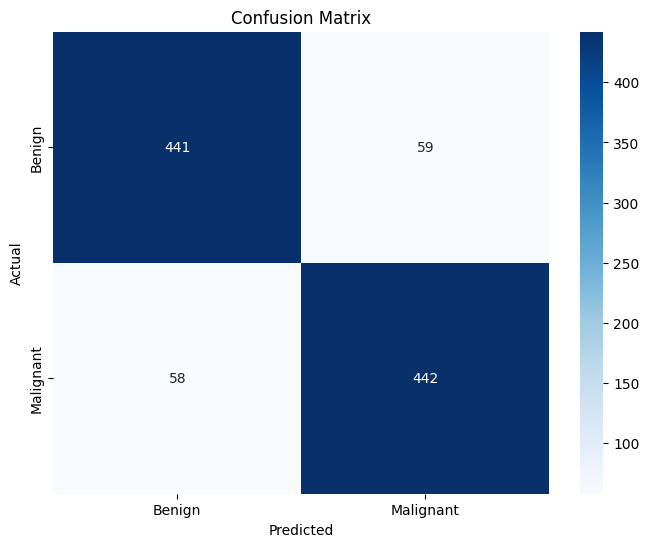


Classification Report:
              precision    recall  f1-score   support

      Benign       0.88      0.88      0.88       500
   Malignant       0.88      0.88      0.88       500

    accuracy                           0.88      1000
   macro avg       0.88      0.88      0.88      1000
weighted avg       0.88      0.88      0.88      1000



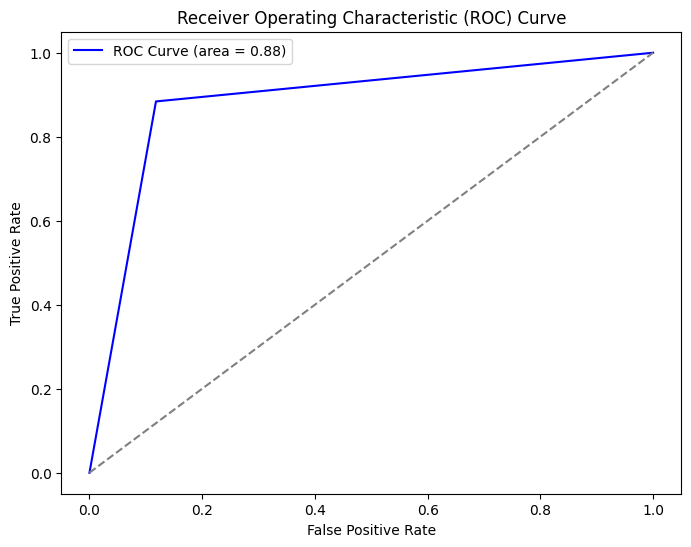

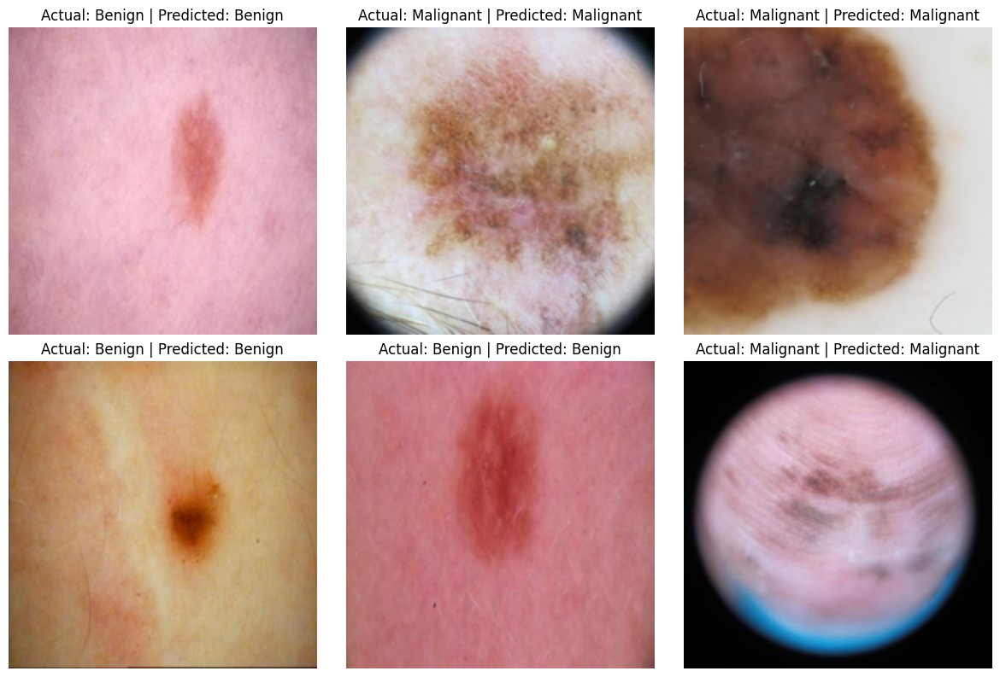

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
import numpy as np


def visualize_results(labels, predictions):
    # Confusion Matrix
    cm = confusion_matrix(labels, predictions)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['Benign', 'Malignant'], yticklabels=['Benign', 'Malignant'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title("Confusion Matrix")
    plt.show()

    # Classification Report
    print("\nClassification Report:")
    print(classification_report(labels, predictions, target_names=['Benign', 'Malignant']))

    try:
        fpr, tpr, _ = roc_curve(labels, predictions, pos_label=1)
        roc_auc = auc(fpr, tpr)

        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, color='blue', label=f'ROC Curve (area = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title("Receiver Operating Characteristic (ROC) Curve")
        plt.legend()
        plt.show()
    except Exception as e:
        print("ROC Curve could not be generated:", e)

    # Sample Predictions Visualization
    sample_indices = np.random.choice(len(labels), 6, replace=False)
    sample_images, sample_labels, sample_preds = [], [], []

    # Load sample images and their predictions
    for idx in sample_indices:
        image, label = test_dataset[idx]
        sample_images.append(image.permute(1, 2, 0).numpy())
        sample_labels.append(labels[idx])
        sample_preds.append(predictions[idx])

    # Plot sample images with actual and predicted labels
    fig, axes = plt.subplots(2, 3, figsize=(12, 8))
    for i, ax in enumerate(axes.flat):
        ax.imshow(sample_images[i])
        ax.axis("off")
        ax.set_title(f"Actual: {['Benign', 'Malignant'][sample_labels[i]]} | Predicted: {['Benign', 'Malignant'][sample_preds[i]]}")
    plt.tight_layout()
    plt.show()

test_labels, test_predictions = test_model(model, test_loader)
visualize_results(test_labels, test_predictions)


#best model results lost the output so pasting ss along with code

30 EPOCHS AND 0.0001

In [ ]:
import torch
import torch.nn as nn
from tqdm import tqdm
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
import numpy as np
import cv2
from torch.optim.lr_scheduler import CosineAnnealingLR
import pywt

class SpectraViT(nn.Module):
    def __init__(self, embed_dim=768):
        super(SpectraViT, self).__init__()
        self.vit = models.vit_b_16(weights=models.ViT_B_16_Weights.DEFAULT)
        self.embed_dim = embed_dim
        self.fourier_layer = FourierLayer()
        self.wavelet_layer = WaveletLayer()
        self.hybrid_pool = HybridPoolingLayer()
        self.fourier_output_channels = 6
        self.wavelet_output_channels = 6
        combined_dim = (self.fourier_output_channels * 112 * 112) + (self.wavelet_output_channels * 28 * 28)
        self.project = nn.Sequential(
            nn.Linear(combined_dim, self.embed_dim),
            nn.BatchNorm1d(self.embed_dim),
            nn.ReLU()
        )
        self.classifier = nn.Linear(self.embed_dim, 2)

    def forward(self, x):
        x_fourier = self.fourier_layer(x)
        x_wavelet = self.wavelet_layer(x)
        x_fourier_pooled = self.hybrid_pool(x_fourier)
        x_wavelet_pooled = self.hybrid_pool(x_wavelet)
        x_fourier_flat = x_fourier_pooled.view(x.size(0), -1)
        x_wavelet_flat = x_wavelet_pooled.view(x.size(0), -1)
        x_combined = torch.cat((x_fourier_flat, x_wavelet_flat), dim=1)
        x_projected = self.project(x_combined)
        x_projected = x_projected.unsqueeze(1)
        x_vit = self.vit.encoder(x_projected)
        x_class = self.classifier(x_vit[:, 0, :])
        return x_class

data_transforms = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
])

train_data_path = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/train'
train_dataset = datasets.ImageFolder(train_data_path, transform=data_transforms)
train_size = int(0.8 * len(train_dataset))
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = random_split(train_dataset, [train_size, val_size])
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SpectraViT().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=0.0001, weight_decay=1e-4)
scheduler = CosineAnnealingLR(optimizer, T_max=10, eta_min=1e-6)

num_epochs = 30
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    with tqdm(train_loader, unit="batch", desc=f"Training Epoch [{epoch + 1}/{num_epochs}]") as tepoch:
        for images, labels in tepoch:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), max_norm=2.0)
            optimizer.step()
            running_loss += loss.item()
            tepoch.set_postfix(loss=running_loss / (tepoch.n + 1))
    scheduler.step()
    train_loss = running_loss / len(train_loader)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    val_loss /= len(val_loader)
    val_accuracy = correct / total * 100
    print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%")

print("Training Complete")


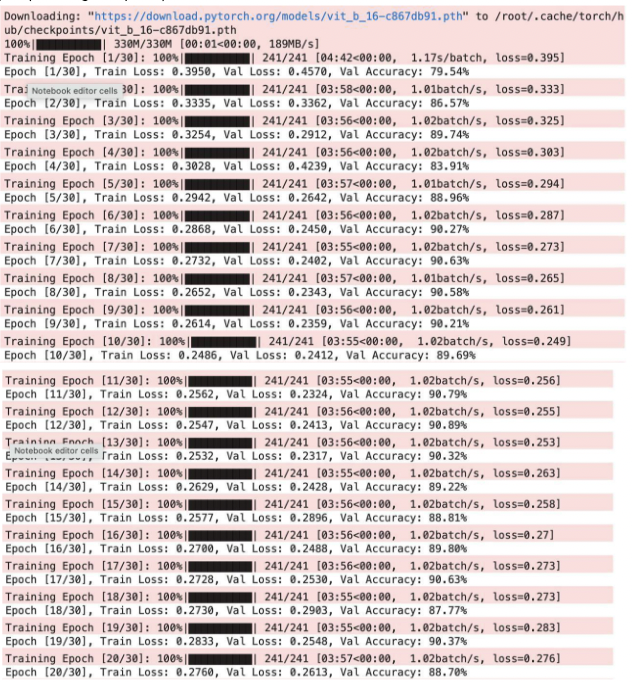

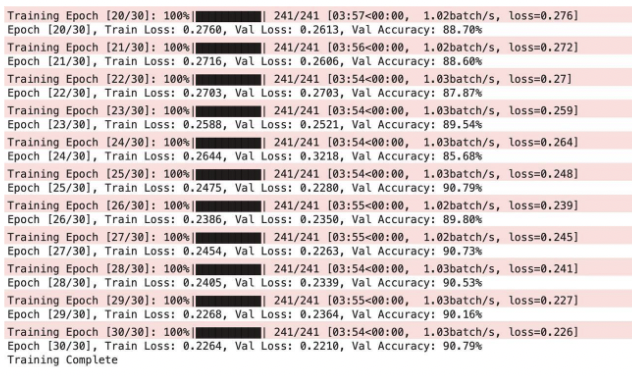

In [ ]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from tqdm import tqdm

test_data = '/kaggle/input/melanoma-skin-cancer-dataset-of-10000-images/melanoma_cancer_dataset/test'
test_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])
test_dataset = datasets.ImageFolder(test_data, transform=test_transforms)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

def test_model(model, test_loader):
    model.eval()
    correct = 0
    total = 0
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for images, labels in tqdm(test_loader, desc="Testing", unit="batch"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    accuracy = 100 * correct / total
    print(f"Testing completed. Accuracy: {accuracy:.2f}%")
    return all_labels, all_preds

test_labels, test_predictions = test_model(model, test_loader)


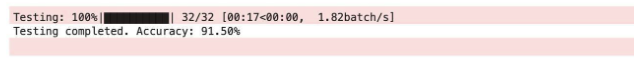

In [ ]:
#visualisation
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

def evaluate_model(model, val_loader, device):
    model.eval()
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    cm = confusion_matrix(all_labels, all_preds)
    plot_confusion_matrix(cm, classes=['Class 0', 'Class 1'])
    print("\nClassification Report:\n", classification_report(all_labels, all_preds))

def plot_confusion_matrix(cm, classes):
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=classes, yticklabels=classes)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()

evaluate_model(model, val_loader, device)

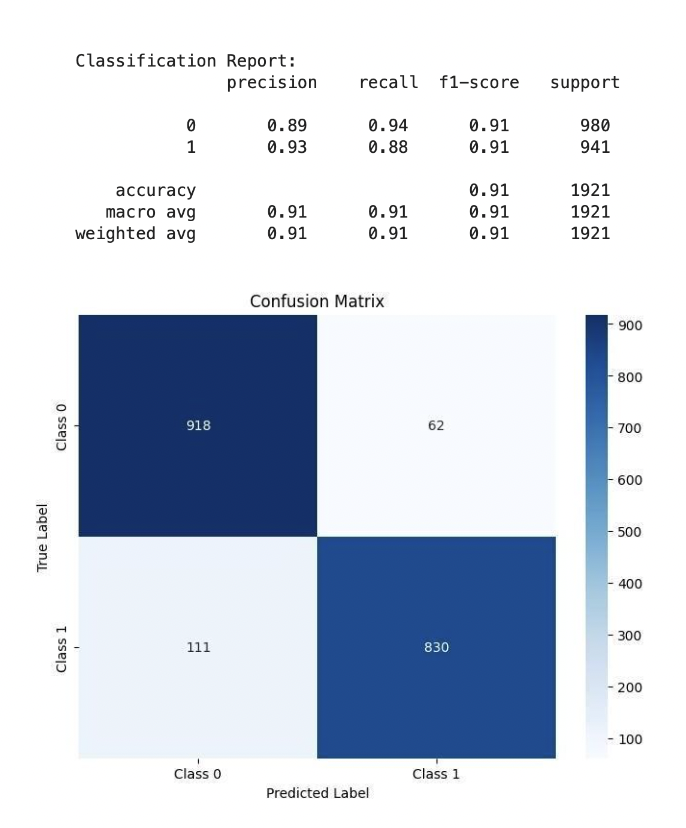

In [ ]:
import numpy as np
from sklearn.metrics import roc_curve, precision_recall_curve, auc, classification_report
import matplotlib.pyplot as plt

TP = 830
FN = 111
TN = 918
FP = 62

y_true = np.array([1]*TP + [1]*FN + [0]*TN + [0]*FP)

np.random.seed(42)
prob_tp = np.random.normal(loc=0.9, scale=0.1, size=TP)
prob_fn = np.random.normal(loc=0.2, scale=0.1, size=FN)
prob_tn = np.random.normal(loc=0.1, scale=0.1, size=TN)
prob_fp = np.random.normal(loc=0.8, scale=0.1, size=FP)

y_scores = np.concatenate([prob_tp, prob_fn, prob_tn, prob_fp])

fpr, tpr, _ = roc_curve(y_true, y_scores)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.grid()
plt.show()

precision, recall, _ = precision_recall_curve(y_true, y_scores)
pr_auc = auc(recall, precision)

plt.figure()
plt.plot(recall, precision, color='purple', lw=2, label='Precision-Recall curve (area = {:.2f})'.format(pr_auc))
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc="lower right")
plt.grid()
plt.show()



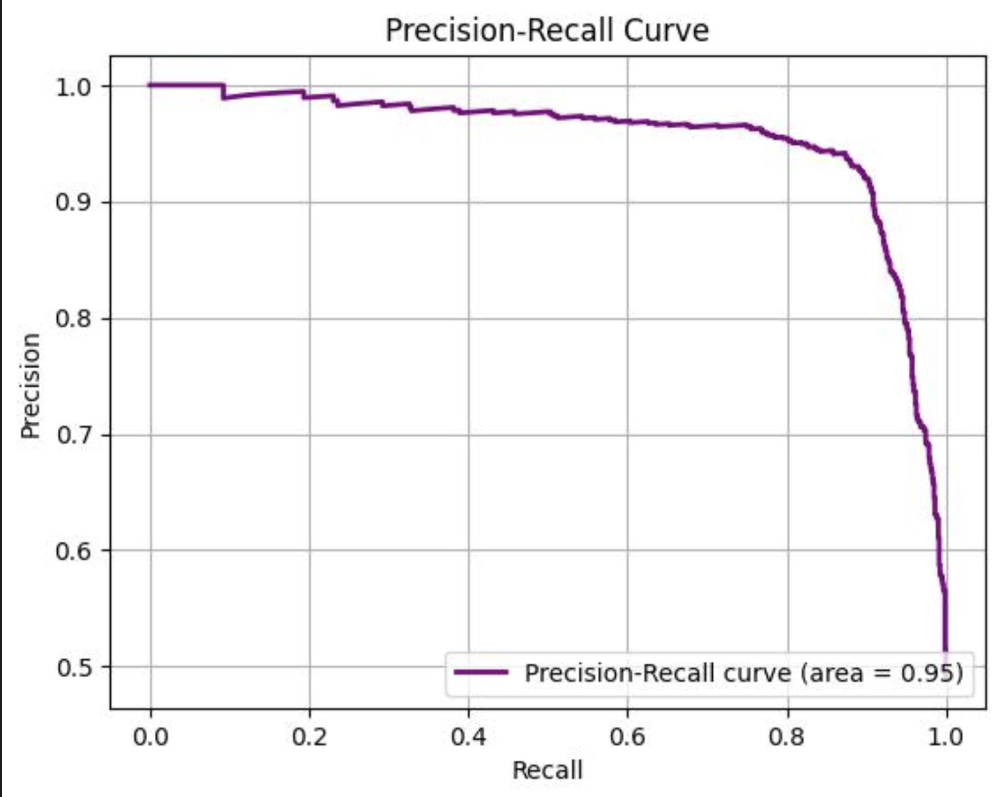